In [37]:
import flwr as fl
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms
import random
import os
from collections import defaultdict

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [38]:
# ===== 모델 정의 =====
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.fc1 = nn.Linear(32 * 8 * 8, 128)
        self.fc2 = nn.Linear(128, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 8 * 8)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
# --- FL 클라이언트들 ---
class FederatedClient(fl.client.NumPyClient):
    def __init__(self, cid, model, train_loader, test_loader, epochs=10):
        self.cid = cid
        self.model = model.to(device)
        self.train_loader = train_loader
        self.test_loader = test_loader
        self.epochs = epochs
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.loss_fn = nn.CrossEntropyLoss()
        self.model.to(self.device)


    def get_parameters(self, config): return [p.cpu().detach().numpy() for p in self.model.parameters()]
    
    def set_parameters(self, parameters):
        for p, new_p in zip(self.model.parameters(), parameters):
            p.data = torch.tensor(new_p, dtype=torch.float32, device=device)

    def fit(self, parameters, config):
        self.set_parameters(parameters)
        self.model.train()
        optimizer = torch.optim.SGD(self.model.parameters(), lr=0.01, momentum=0.9)
        for _ in range(self.epochs):
            for x, y in self.train_loader:
                x, y = x.to(device), y.to(device)
                optimizer.zero_grad()
                loss = nn.CrossEntropyLoss()(self.model(x), y)
                loss.backward()
                optimizer.step()
        return self.get_parameters(config), len(self.train_loader.dataset), {"cid": self.cid}

    def evaluate(self, parameters, config):
        self.set_parameters(parameters)
        loss, correct, total = 0.0, 0, 0

        with torch.no_grad():
            for x, y in self.test_loader:
                x, y = x.to(self.device), y.to(self.device)
                outputs = self.model(x)
                loss += self.loss_fn(outputs, y).item() * x.size(0)
                predicted = outputs.argmax(1)
                correct += (predicted == y).sum().item()
                total += y.size(0)

        avg_loss = loss / total
        accuracy = correct / total

        return avg_loss, total, {"accuracy": accuracy, "loss": avg_loss, "cid": self.cid}  # ✅ loss도 추가



In [ ]:
# --- 클라이언트 행동 변종 ---
class LazyClient(FederatedClient):
    def __init__(self, cid, model, train_loader, test_loader):
        super().__init__(cid, model, train_loader, test_loader, epochs=5)

    def fit(self, parameters, config):
        self.set_parameters(parameters)
        self.model.train()
        optimizer = torch.optim.SGD(self.model.parameters(), lr=0.01)
        for _ in range(5):  # 적게 학습
            for x, y in self.train_loader:
                x, y = x.to(device), y.to(device)
                optimizer.zero_grad()
                loss = nn.CrossEntropyLoss()(self.model(x), y)
                loss.backward()
                optimizer.step()
        return self.get_parameters(config), len(self.train_loader.dataset), {"cid": self.cid}
    
    def evaluate(self, parameters, config):
        self.set_parameters(parameters)
        loss, correct, total = 0.0, 0, 0

        with torch.no_grad():
            for x, y in self.test_loader:
                x, y = x.to(self.device), y.to(self.device)
                outputs = self.model(x)
                loss += self.loss_fn(outputs, y).item() * x.size(0)
                predicted = outputs.argmax(1)
                correct += (predicted == y).sum().item()
                total += y.size(0)

        avg_loss = loss / total
        accuracy = correct / total

        return avg_loss, total, {"accuracy": accuracy, "loss": avg_loss, "cid": self.cid}  # ✅ loss도 추가



class RandomClient(FederatedClient):
    def __init__(self, cid, model, train_loader, test_loader):
        super().__init__(cid, model, train_loader, test_loader)
        
    def fit(self, parameters, config):
        shape_params = [np.random.randn(*p.shape).astype(np.float32) for p in parameters]
        return shape_params, len(self.train_loader.dataset), {"cid": self.cid}

    def evaluate(self, parameters, config):
        self.set_parameters(parameters)
        loss, correct, total = 0.0, 0, 0

        with torch.no_grad():
            for x, y in self.test_loader:
                x, y = x.to(self.device), y.to(self.device)
                outputs = self.model(x)
                loss += self.loss_fn(outputs, y).item() * x.size(0)
                predicted = outputs.argmax(1)
                correct += (predicted == y).sum().item()
                total += y.size(0)

        avg_loss = loss / total
        accuracy = correct / total

        return avg_loss, total, {"accuracy": accuracy, "loss": avg_loss, "cid": self.cid}  # ✅ loss도 추가

    
class EchoClient(FederatedClient):
    def __init__(self, cid, model, train_loader, test_loader):
        super().__init__(cid, model, train_loader, test_loader)
        self.buffer = []
        self.round = 0

    def fit(self, parameters, config):
        self.round += 1
        self.buffer.append(parameters)

        if self.round <= 2:
            print(f"[EchoClient] Round {self.round}: returning current parameters (initial phase)")
            return parameters, len(self.train_loader.dataset), {"cid": self.cid}
        else:
            echoed = self.buffer[-3]  # 2 라운드 이전의 파라미터 반환
            print(f"[EchoClient] Round {self.round}: returning parameters from round {self.round - 2}")
            return echoed, len(self.train_loader.dataset), {"cid": self.cid}

    def evaluate(self, parameters, config):
        self.set_parameters(parameters)
        loss, correct, total = 0.0, 0, 0

        with torch.no_grad():
            for x, y in self.test_loader:
                x, y = x.to(self.device), y.to(self.device)
                outputs = self.model(x)
                loss += self.loss_fn(outputs, y).item() * x.size(0)
                predicted = outputs.argmax(1)
                correct += (predicted == y).sum().item()
                total += y.size(0)

        avg_loss = loss / total
        accuracy = correct / total

        return avg_loss, total, {"accuracy": accuracy, "loss": avg_loss, "cid": self.cid}  # ✅ loss도 추가



class SmallClient(FederatedClient):
    def __init__(self, cid, model, train_loader, test_loader):
        # train_loader의 데이터 수가 적어야 비정상으로 간주되도록!
        small_train_loader = torch.utils.data.DataLoader(
            list(train_loader.dataset)[:200],  # 작은 부분만 사용
            batch_size=32, shuffle=True
        )
        super().__init__(cid, model, small_train_loader, test_loader, epochs=10)

    def fit(self, parameters, config):
        self.set_parameters(parameters)
        self.model.train()
        optimizer = torch.optim.SGD(self.model.parameters(), lr=0.01, momentum=0.9)
        for _ in range(self.epochs):
            for x, y in self.train_loader:
                x, y = x.to(device), y.to(device)
                optimizer.zero_grad()
                loss = nn.CrossEntropyLoss()(self.model(x), y)
                loss.backward()
                optimizer.step()
        return self.get_parameters(config), len(self.train_loader.dataset), {"cid": self.cid}

    def evaluate(self, parameters, config):
        self.set_parameters(parameters)
        loss, correct, total = 0.0, 0, 0

        with torch.no_grad():
            for x, y in self.test_loader:
                x, y = x.to(self.device), y.to(self.device)
                outputs = self.model(x)
                loss += self.loss_fn(outputs, y).item() * x.size(0)
                predicted = outputs.argmax(1)
                correct += (predicted == y).sum().item()
                total += y.size(0)

        avg_loss = loss / total
        accuracy = correct / total

        return avg_loss, total, {"accuracy": accuracy, "loss": avg_loss, "cid": self.cid}  # ✅ loss도 추가


In [41]:
# ===== 데이터 로딩 및 분할 =====
def load_data(num_clients=10):
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
    dataset = datasets.CIFAR10(root="./data", train=True, download=True, transform=transform)
    indices = list(range(len(dataset)))
    random.shuffle(indices)
    split_size = len(dataset) // num_clients
    return [Subset(dataset, indices[i * split_size:(i + 1) * split_size]) for i in range(num_clients)]

def create_dataloaders(partition):
    train_size = int(0.8 * len(partition))
    test_size = len(partition) - train_size
    train_data, test_data = torch.utils.data.random_split(partition, [train_size, test_size])
    train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
    test_loader = DataLoader(test_data, batch_size=32, shuffle=False)
    return train_loader, test_loader

In [ ]:
# ===== FL 시뮬레이션 =====
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
accuracy_log = defaultdict(dict)

# 결과 저장용
results_acc = {
    "round": [],
    "accuracy": [],
    "client_type": [],
    "malicious_ratio": []
}

results_loss = {
    "round": [],
    "loss": [],
    "client_type": [],
    "malicious_ratio": []
}


# 예시로 결과 저장 (각 round 끝날 때 호출해줘야 함)
def log_result_acc(round_num, accuracy, client_type, malicious_ratio):
    results_acc["round"].append(round_num)
    results_acc["accuracy"].append(accuracy)
    results_acc["client_type"].append(client_type)
    results_acc["malicious_ratio"].append(malicious_ratio)

def log_result_loss(round_num, loss, client_type, malicious_ratio):
    results_loss["round"].append(round_num)
    results_loss["loss"].append(loss)
    results_loss["client_type"].append(client_type)
    results_loss["malicious_ratio"].append(malicious_ratio)


class LoggingStrategy(fl.server.strategy.FedAvg):
    def __init__(self, client_type):
        super().__init__()
        self.client_type = client_type

    def aggregate_evaluate(self, rnd, results, failures):
        accs = []
        losses = []
        for _, _, metrics in results:
            if "accuracy" in metrics and "loss" in metrics:
                accs.append(metrics["accuracy"])
                losses.append(metrics["loss"])
        if accs and losses:
            avg_acc = sum(accs) / len(accs)
            avg_loss = sum(losses) / len(losses)
            log_result_acc(rnd, avg_acc, self.sim_name, self.sim_ratio)
            log_result_loss(rnd, avg_loss, self.sim_name, self.sim_ratio)
        return super().aggregate_evaluate(rnd, results, failures)



def simulate_with_malicious_clients(malicious_type, num_malicious, num_rounds): 
    partitions = load_data(10)
    clients = []
    
    def get_client_by_type(ctype, cid, model, train_loader, test_loader):
        if ctype == "random":
            return RandomClient(cid, model, train_loader, test_loader)
        elif ctype == "lazy":
            return LazyClient(cid, model, train_loader, test_loader)
        elif ctype == "echo":
            return EchoClient(cid, model, train_loader, test_loader)
        elif ctype == "small":
            return SmallClient(cid, model, train_loader, test_loader)
        else:
            return FederatedClient(cid, model, train_loader, test_loader)

    for i in range(10):
        cid = str(i)
        model = SimpleCNN()
        train_loader, test_loader = create_dataloaders(partitions[i])

        if malicious_type == "all":
            # 균등하게 4가지 악의적 클라이언트 각 1개씩 + 나머지 정상
            if i == 0:
                clients.append(RandomClient(cid, model, train_loader, test_loader))
            elif i == 1:
                clients.append(LazyClient(cid, model, train_loader, test_loader))
            elif i == 2:
                clients.append(EchoClient(cid, model, train_loader, test_loader))
            elif i == 3:
                clients.append(SmallClient(cid, model, train_loader, test_loader))
            else:
                clients.append(FederatedClient(cid, model, train_loader, test_loader))

        elif malicious_type == "mix":
            # 임의의 타입을 랜덤하게 부여
            import random
            if i < num_malicious:
                ctype = random.choice(["random", "lazy", "echo", "small"])
                clients.append(get_client_by_type(ctype, cid, model, train_loader, test_loader))
            else:
                clients.append(FederatedClient(cid, model, train_loader, test_loader))

        else:
            # 기존 방식 유지
            if i < num_malicious:
                clients.append(get_client_by_type(malicious_type, cid, model, train_loader, test_loader))
            else:
                clients.append(FederatedClient(cid, model, train_loader, test_loader))

    def fit_config(rnd):
        return {"rnd": rnd}

    fl.simulation.start_simulation(
        client_fn=lambda cid: clients[int(cid)],
        num_clients=10,
        config=fl.server.ServerConfig(num_rounds=num_rounds),
        strategy=LoggingStrategy(f"{malicious_type}_{num_malicious}"),
        client_resources={"num_cpus": 1}
    )


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_results():
    df_acc = pd.DataFrame(results_acc)
    df_loss = pd.DataFrame(results_loss)

    # 문자열 처리 대비
    for df in [df_acc, df_loss]:
        df["client_type"] = df["client_type"].astype(str)
        df["malicious_ratio"] = df["malicious_ratio"].astype(str)
        df["label"] = df["client_type"] + "_" + df["malicious_ratio"]

    # --- 그래프 1: 모든 조합 비교 ---
    plt.figure(figsize=(10, 6))
    for label in df_acc["label"].unique():
        df_l = df_acc[df_acc["label"] == label]
        plt.plot(df_l["round"], df_l["accuracy"], label=label)
    plt.title("Comparison (Accuracy): All Combinations of Client Types")
    plt.xlabel("Round")
    plt.ylabel("Accuracy")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=1)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 6))
    for label in df_loss["label"].unique():
        df_l = df_loss[df_loss["label"] == label]
        plt.plot(df_l["round"], df_l["loss"], label=label)
    plt.title("Comparison (Loss): All Combinations of Client Types")
    plt.xlabel("Round")
    plt.ylabel("Loss")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=1)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # --- 그래프 2: 유형별 악성 비율 비교 (단일 타입만) ---
    baseline_types = df_acc["client_type"].unique()
    for ctype in baseline_types:
        if ctype in ["all", "mix"]:  # 복합 조합은 생략
            continue

        # Accuracy
        plt.figure(figsize=(10, 6))
        df_c = df_acc[df_acc["client_type"] == ctype]
        for ratio in sorted(df_c["malicious_ratio"].unique(), key=lambda x: int(x)):
            df_r = df_c[df_c["malicious_ratio"] == ratio]
            plt.plot(df_r["round"], df_r["accuracy"], label=f"Ratio: {ratio}")
        plt.title(f"{ctype} Clients (Accuracy): Accuracy over Rounds")
        plt.xlabel("Round")
        plt.ylabel("Accuracy")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        # Loss
        plt.figure(figsize=(10, 6))
        df_c = df_loss[df_loss["client_type"] == ctype]
        for ratio in sorted(df_c["malicious_ratio"].unique(), key=lambda x: int(x)):
            df_r = df_c[df_c["malicious_ratio"] == ratio]
            plt.plot(df_r["round"], df_r["loss"], label=f"Ratio: {ratio}")
        plt.title(f"{ctype} Clients (Loss): Loss over Rounds")
        plt.xlabel("Round")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # --- 그래프 3: 정상 vs 복합 조합 비교 ---
    if "all" in df_acc["client_type"].unique() and "mix" in df_acc["client_type"].unique():
        plt.figure(figsize=(10, 6))
        for label in ["mix_0", "all_4"]:
            df_l = df_acc[df_acc["label"] == label]
            plt.plot(df_l["round"], df_l["accuracy"], label=label)
        plt.title("Normal (mix_0) vs Combined Attack (all_4) (Accuracy)")
        plt.xlabel("Round")
        plt.ylabel("Accuracy")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(10, 6))
        for label in ["mix_0", "all_4"]:
            df_l = df_loss[df_loss["label"] == label]
            plt.plot(df_l["round"], df_l["loss"], label=label)
        plt.title("Normal (mix_0) vs Combined Attack (all_4) (Loss)")
        plt.xlabel("Round")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    
    df_acc.to_csv("malicious_simulation_accuracy.csv", index=False)
    df_loss.to_csv("malicious_simulation_loss.csv", index=False)
    print("✅ 시뮬레이션 결과가 CSV 파일로 저장되었습니다.")




Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
2025-04-18 23:34:10,351	INFO worker.py:1841 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'accelerator_type:G': 1.0, 'node:__internal_head__': 1.0, 'CPU': 20.0, 'memory': 8395011687.0, 'node:127.0.0.1': 1.0, 'object_store_memory': 4197505843.0, 'GPU': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1}
INFO :      Flower VCE: Creating V

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=10016) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=10016)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=10016)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=23940) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=23940)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=23940)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=37132) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=37132)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=37132)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=23836) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=23836)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=23836)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=20776) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=20776)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=20776)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=35296) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=35296)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=35296)             entirely in future versions of Flower. [repeated 3x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=5088) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=5088)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=5088)             entirely in future versions of Flower. [repeated 3x across cluster]
(Cli

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=4560) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=4560)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=4560)             entirely in future versions of Flower. [repeated 3x across cluster]
(Cli

(ClientAppActor pid=29092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=18152) 
(ClientAppActor pid=18152)         
(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=9248) 
(ClientAppActor pid=9248)         
(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
(ClientAppActor pid=35228) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=35228)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=35228)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=35228) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=9248) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=18152) 
(ClientAppActor pid=18152)         
(ClientAppActor pid=18152) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=18152)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=18152)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=18152) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
(ClientAppActor

(ClientAppActor pid=35228) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
(ClientAppActor pid=27068) 
(ClientAppActor pid=27068)         
(ClientAppActor pid=27068) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=27068)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=27068)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=27068) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 4x across cluster]
(ClientAppActor pid=29092) 
(ClientAppActor pid=29092)         
INFO :      agg

(ClientAppActor pid=27068) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=29092) 
(ClientAppActor pid=29092)         
(ClientAppActor pid=18152) 
(ClientAppActor pid=18152)         
(ClientAppActor pid=18152) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=18152)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=18152)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=18152) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=39832) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=10200) 
(ClientAppActor pid=10200)         
(ClientAppActor pid=18152) 
(ClientAppActor pid=18152)         
(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=20488) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=20488)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=20488)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=20488) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor

(ClientAppActor pid=29092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=27344) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=27344)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=27344)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=27344) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=39832) 
(ClientAppActor pid=39832)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=18152) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=39832) 
(ClientAppActor pid=39832)         
(ClientAppActor pid=39832) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=39832)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=39832)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=39832) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 4x across cluster]
(ClientAppActor pid=7148) 
(ClientAppActor pid=7148)         
(ClientAppActor p

(ClientAppActor pid=29092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=9248) 
(ClientAppActor pid=9248)         
(ClientAppActor pid=10200) 
(ClientAppActor pid=10200)         
(ClientAppActor pid=7148) 
(ClientAppActor pid=7148)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=27344) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=27344)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=27344)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=27344) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was r

(ClientAppActor pid=27068) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=18152) 
(ClientAppActor pid=18152)         
(ClientAppActor pid=10200) 
(ClientAppActor pid=10200)         
(ClientAppActor pid=10200) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=10200)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=10200)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=10200) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=7148) 
(ClientAppActor pid=7148)         
(ClientAppActor p

(ClientAppActor pid=39832) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27068) 
(ClientAppActor pid=27068)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=27068) 
(ClientAppActor pid=27068)         
(ClientAppActor pid=27068) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=27068)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=27068)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=27068) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=7148) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
(ClientAppActor pid=35228) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=35228)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=35228)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=35228) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=9248) 
(ClientAppActor pid=9248)         
(ClientAppActor pid=29092) 
(ClientAppActor pid=29092)         
(ClientAppActor p

(ClientAppActor pid=39832) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=29092) 
(ClientAppActor pid=29092)         
(ClientAppActor pid=9248) 
(ClientAppActor pid=9248)         
(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
(ClientAppActor pid=27068) 
(ClientAppActor pid=27068)         
(ClientAppActor pid=27068) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=27068)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=27068)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=27068) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was

(ClientAppActor pid=39832) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=18152) 
(ClientAppActor pid=18152)         
(ClientAppActor pid=18152) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=18152)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=18152)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=18152) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=35228) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
(ClientAppActor pid=35228) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=35228)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=35228)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=35228) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=10200) 
(ClientAppActor pid=10200)         
(ClientAppActor pid=7148) 
(ClientAppActor pid=7148)         
(ClientAppActor p

(ClientAppActor pid=29092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=39832) 
(ClientAppActor pid=39832)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=39832) 
(ClientAppActor pid=39832)         
(ClientAppActor pid=39832) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=39832)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=39832)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=39832) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=27068) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=10200) 
(ClientAppActor pid=10200)         
(ClientAppActor pid=10200) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=10200)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=10200)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=10200) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=39832) 
(ClientAppActor pid=39832)         
(ClientAppActor pid=18152) 
(ClientAppActor pid=18152)         
(ClientAppActor

(ClientAppActor pid=39832) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=18152) 
(ClientAppActor pid=18152)         
(ClientAppActor pid=29092) 
(ClientAppActor pid=29092)         
(ClientAppActor pid=29092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=29092)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=29092)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=29092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 4x across cluster]
(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor

(ClientAppActor pid=35228) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=9248) 
(ClientAppActor pid=9248)         
(ClientAppActor pid=9248) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=9248)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=9248)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=9248) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=27068) 
(ClientAppActor pid=27068)         
INFO :      aggregate

(ClientAppActor pid=39832) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=7148) 
(ClientAppActor pid=7148)         
(ClientAppActor pid=18152) 
(ClientAppActor pid=18152)         
(ClientAppActor pid=9248) 
(ClientAppActor pid=9248)         
(ClientAppActor pid=29092) 
(ClientAppActor pid=29092)         
(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=20488) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=20488)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=20488)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=20488) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was r

(ClientAppActor pid=35228) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
(ClientAppActor pid=39832) 
(ClientAppActor pid=39832)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=39832) 
(ClientAppActor pid=39832)         
(ClientAppActor pid=39832) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=39832)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=39832)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=39832) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyCli

(ClientAppActor pid=35228) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=27068) 
(ClientAppActor pid=27068)         
(ClientAppActor pid=27068) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=27068)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=27068)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=27068) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=9248) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=10200) 
(ClientAppActor pid=10200)         
(ClientAppActor pid=7148) 
(ClientAppActor pid=7148)         
(ClientAppActor pid=29092) 
(ClientAppActor pid=29092)         
(ClientAppActor pid=29092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=29092)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=29092)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=29092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor p

(ClientAppActor pid=29092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
(ClientAppActor pid=35228) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=35228)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=35228)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=35228) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=9248) 
(ClientAppActor pid=9248)         
INFO :      aggre

(ClientAppActor pid=18152) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=39832) 
(ClientAppActor pid=39832)         
(ClientAppActor pid=39832) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=39832)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=39832)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=39832) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
(ClientAppActor pid=27068) 
(ClientAppActor pid=27068)         
(ClientAppActor

(ClientAppActor pid=18152) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=27344) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=27344)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=27344)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=27344) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=27068) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=9248) 
(ClientAppActor pid=9248)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=39832) 
(ClientAppActor pid=39832)         
(ClientAppActor pid=39832) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=39832)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=39832)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=39832) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor p

(ClientAppActor pid=7148) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=29092) 
(ClientAppActor pid=29092)         
(ClientAppActor pid=18152) 
(ClientAppActor pid=18152)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=10200) 
(ClientAppActor pid=10200)         
(ClientAppActor pid=10200) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=10200)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=10200)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=10200) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=10200) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=35228) 
(ClientAppActor pid=35228)         
(ClientAppActor pid=27068) 
(ClientAppActor pid=27068)         
(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=20488) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=20488)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=20488)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=20488) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=27068) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=29092) 
(ClientAppActor pid=29092)         
(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=9248) 
(ClientAppActor pid=9248)         
(ClientAppActor pid=9248) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=9248)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=9248)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=9248) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=1

(ClientAppActor pid=10200) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20488) 
(ClientAppActor pid=20488)         
(ClientAppActor pid=29092) 
(ClientAppActor pid=29092)         
(ClientAppActor pid=39832) 
(ClientAppActor pid=39832)         
(ClientAppActor pid=7148) 
(ClientAppActor pid=7148)         
(ClientAppActor pid=7148) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=7148)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=7148)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=7148) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=20488) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=20488)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=20488)             entirely in future versions of Flower. [repeated 2x across cluster]
(

(ClientAppActor pid=31404) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=39056) 
(ClientAppActor pid=39056)         
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=29320) 
(ClientAppActor pid=29320)         
(ClientAppActor pid=29320) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=29320)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=29320)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=29320) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 4x across cluster]
(ClientAppActor

(ClientAppActor pid=27936) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=38648) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=38648)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=38648)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=38648) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=29320) 
(ClientAppActor pid=29320)         
(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor

(ClientAppActor pid=22748) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=39056) 
(ClientAppActor pid=39056)         
(ClientAppActor pid=39056) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=39056)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=39056)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=39056) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=29320) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=31404) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=31404)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=31404)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=31404) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor

(ClientAppActor pid=27936) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=22748) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=22748)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=22748)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=22748) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=26612) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor pid=22132) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=22132)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=22132)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=22132) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor

(ClientAppActor pid=29320) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor pid=21156) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=21156)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=21156)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=21156) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor

(ClientAppActor pid=22132) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=39056) 
(ClientAppActor pid=39056)         
(ClientAppActor pid=39056) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=39056)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=39056)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=39056) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
INFO :      agg

(ClientAppActor pid=27936) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor pid=22132) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22132)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22132)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22132) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=38648) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=27936) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=27936)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=27936)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=27936) WARNING :   Deprecation Warning: The `client_fn` function m

(ClientAppActor pid=22748) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor pid=26612) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=26612)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=26612)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=26612) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor

(ClientAppActor pid=29320) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=38648) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=38648)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=38648)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=38648) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=26612) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=28792) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=28792)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=28792)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=28792) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor

(ClientAppActor pid=31404) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=29320) 
(ClientAppActor pid=29320)         
(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=38648) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=38648)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=38648)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=38648) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=21156) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=28792) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=28792)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=28792)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=28792) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor

(ClientAppActor pid=27936) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=39056) 
(ClientAppActor pid=39056)         
(ClientAppActor pid=39056) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=39056)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=39056)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=39056) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
INFO :      agg

(ClientAppActor pid=22748) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=39056) 
(ClientAppActor pid=39056)         
(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=31404) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=31404)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=31404)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=31404) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor

(ClientAppActor pid=21156) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=27936) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=27936)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=27936)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=27936) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=31404) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor pid=29320) 
(ClientAppActor pid=29320)         
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor pid=21156) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=21156)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=21156)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=21156) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=21156) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=22748) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22748)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22748)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22748) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
INFO :      agg

(ClientAppActor pid=39056) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=22748) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22748)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22748)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22748) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=27936) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor pid=21156) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=21156)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=21156)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=21156) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=28792) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor pid=21156) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=21156)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=21156)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=21156) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor

(ClientAppActor pid=21156) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=29320) 
(ClientAppActor pid=29320)         
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor pid=39056) 
(ClientAppActor pid=39056)         
(ClientAppActor pid=39056) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=39056)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=39056)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=39056) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=39056) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=28792) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=28792)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=28792)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=28792) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=22132) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor pid=26612) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=26612)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=26612)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=26612) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor

(ClientAppActor pid=28792) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=29320) 
(ClientAppActor pid=29320)         
(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=38648) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=38648)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=38648)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=38648) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor

(ClientAppActor pid=22132) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor pid=26612) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=26612)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=26612)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=26612) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=22748) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=31404) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=31404)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=31404)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=31404) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor

(ClientAppActor pid=22132) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=28792) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=28792)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=28792)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=28792) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=29320) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=38648) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=38648)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=38648)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=38648) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor

(ClientAppActor pid=26612) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor pid=21156) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=21156)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=21156)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=21156) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=39056) 
(ClientAppActor pid=39056)         
(ClientAppActor

(ClientAppActor pid=22748) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=31404) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=31404)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=31404)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=31404) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=29320) 
(ClientAppActor pid=29320)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=21156) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=22748) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22748)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22748)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22748) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor

(ClientAppActor pid=22748) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=38648) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=38648)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=38648)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=38648) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor

(ClientAppActor pid=29320) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=38648) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=38648)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=38648)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=38648) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=38648) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=22748) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=22748)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=22748)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=22748) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=22132) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=39056) 
(ClientAppActor pid=39056)         
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor pid=22132) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22132)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22132)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22132) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=38648) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=22132) 
(ClientAppActor pid=22132)         
(ClientAppActor pid=22132) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=22132)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=22132)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=22132) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=39056) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=28792) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=28792)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=28792)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=28792) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor

(ClientAppActor pid=22132) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=28792) 
(ClientAppActor pid=28792)         
(ClientAppActor pid=28792) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=28792)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=28792)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=28792) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=28792) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26612) 
(ClientAppActor pid=26612)         
(ClientAppActor pid=29320) 
(ClientAppActor pid=29320)         
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=38648) 
(ClientAppActor pid=38648)         
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=27936) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=27936)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=27936)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=27936) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=22132) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=31404) 
(ClientAppActor pid=31404)         
(ClientAppActor pid=21156) 
(ClientAppActor pid=21156)         
(ClientAppActor pid=29320) 
(ClientAppActor pid=29320)         
(ClientAppActor pid=29320) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=29320)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=29320)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=29320) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor

(ClientAppActor pid=21156) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=39056) 
(ClientAppActor pid=39056)         
(ClientAppActor pid=27936) 
(ClientAppActor pid=27936)         
(ClientAppActor pid=22748) 
(ClientAppActor pid=22748)         
(ClientAppActor pid=22748) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=22748)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=22748)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=22748) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=21156) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=21156)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=21156)             entirely in future versions of Flower. [repeated 2x across cluster]
(

(ClientAppActor pid=39056) [EchoClient] Round 1: returning current parameters (initial phase)


2025-04-19 03:59:51,557	INFO worker.py:1841 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'accelerator_type:G': 1.0, 'node:__internal_head__': 1.0, 'CPU': 20.0, 'memory': 9107730432.0, 'node:127.0.0.1': 1.0, 'object_store_memory': 4553865216.0, 'GPU': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 20 actors
INFO :      [INIT]
INFO :      Requesting initial parameters from one random client
INFO :      Received initial parameters from one random client
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=6340) WARNING :   DEPRECATED FEATURE: `client_fn` 

(ClientAppActor pid=24560) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=19732) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context`
(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)             This is a deprecated feature. It will be removed
(ClientAppActor pid=19732)             entirely in future versions of Flower.
(ClientAppActor pid=19732)         
(ClientAppActor pid=19732) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`.
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(Clie

(ClientAppActor pid=22772) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=30800) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=30800)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=30800)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=30800) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]


(ClientAppActor pid=30800) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=20668) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context`
(ClientAppActor pid=20668)             This is a deprecated feature. It will be removed
(ClientAppActor pid=20668)             entirely in future versions of Flower.
(ClientAppActor pid=20668) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`.
(ClientAppActor pid=4328) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context

(ClientAppActor pid=19732) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         


(ClientAppActor pid=38572) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=16092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=16092)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=16092)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=16092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(ClientAppActor p

(ClientAppActor pid=38572) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=16092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 7x across cluster]
(ClientAppActor pid=16092)             This is a deprecated feature. It will be removed [repeated 7x across cluster]
(ClientAppActor pid=16092)             entirely in future versions of Flower. [repeated 7x across cluster]
(ClientAppActor pid=16092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 7x across cluster]
(ClientAppActor p

(ClientAppActor pid=19732) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=22772) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=22772)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=22772)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=22772) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor p

(ClientAppActor pid=30800) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=32240) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=32240)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=32240)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=32240) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]


(ClientAppActor pid=32240) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=38572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=38572)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=38572)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=38572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=6340) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=20668) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=20668)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=20668)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=20668) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         


(ClientAppActor pid=16092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=30800) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=30800)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=30800)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=30800) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=19732) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=30800) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=30800)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=30800)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=30800) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=32240) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=38572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=38572)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=38572)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=38572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=38572) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         


(ClientAppActor pid=6340) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=16092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=16092)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=16092)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=16092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=30800) [EchoClient] Round 1: returning current parameters (initial phase)
(ClientAppActor pid=20668) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(ClientAppActor pid=4328) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=4328)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=4328)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=4328) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=2

(ClientAppActor pid=6340) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=32240) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=32240)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=32240)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=32240) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor

(ClientAppActor pid=4328) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=22772) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=22772)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=22772)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=22772) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor

(ClientAppActor pid=6340) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=19732) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=19732)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=19732)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=19732) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=38572) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=19732) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=19732)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=19732)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=19732) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]


(ClientAppActor pid=19732) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=22772) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22772)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22772)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22772) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was

(ClientAppActor pid=32240) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=24560) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=24560)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=24560)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=24560) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor

(ClientAppActor pid=6340) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=38572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=38572)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=38572)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=38572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyCli

(ClientAppActor pid=16092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         


(ClientAppActor pid=4328) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=20668) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=20668)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=20668)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=20668) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
INFO :      agg

(ClientAppActor pid=16092) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=20668) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=20668)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=20668)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=20668) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor

(ClientAppActor pid=38572) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=22772) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22772)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22772)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22772) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=16092) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=22772) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=22772)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=22772)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=22772) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor

(ClientAppActor pid=6340) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=38572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=38572)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=38572)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=38572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=4328) [EchoClient] Round 1: returning current parameters (initial phase)
(ClientAppActor pid=6340) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=6340) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=6340)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=6340)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=6340) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 4x across cluster]
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
INFO :      aggregate

(ClientAppActor pid=19732) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=38572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=38572)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=38572)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=38572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor

(ClientAppActor pid=20668) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=24560) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=24560)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=24560)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=24560) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=4328) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=38572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=38572)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=38572)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=38572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
INFO :      agg

(ClientAppActor pid=38572) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=16092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=16092)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=16092)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=16092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]


(ClientAppActor pid=16092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=6340) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=6340)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=6340)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=6340) WARNING :   Deprecation Warning: The `client_fn` function must return an 

(ClientAppActor pid=24560) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(ClientAppActor pid=4328) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=4328)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=4328)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=4328) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=3

(ClientAppActor pid=19732) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=16092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=16092)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=16092)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=16092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=38572) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=20668) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=20668)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=20668)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=20668) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor p

(ClientAppActor pid=4328) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=19732) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=19732)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=19732)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=19732) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=4328) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=24560) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=24560)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=24560)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=24560) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor

(ClientAppActor pid=32240) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=6340) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=6340)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=6340)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=6340) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=3

(ClientAppActor pid=4328) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=30800) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=30800)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=30800)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=30800) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=19732) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=20668) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=20668)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=20668)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=20668) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         


(ClientAppActor pid=6340) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=20668) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=20668)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=20668)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=20668) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=19732) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=32240) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=32240)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=32240)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=32240) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor p

(ClientAppActor pid=38572) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=30800) 
(ClientAppActor pid=30800)         
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=22772) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22772)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22772)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22772) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=30800) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=16092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=16092)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=16092)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=16092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=20668) 
(ClientAppActor pid=20668)         
(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(ClientAppActor p

(ClientAppActor pid=22772) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=19732) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=19732)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=19732)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=19732) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=4328) [EchoClient] Round 1: returning current parameters (initial phase)
(ClientAppActor pid=19732) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=22772) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22772)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22772)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22772) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=30800) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=16092) 
(ClientAppActor pid=16092)         
(ClientAppActor pid=16092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=16092)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=16092)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=16092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=38572) 
(ClientAppActor pid=38572)         
(ClientAppActor

(ClientAppActor pid=19732) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(ClientAppActor pid=4328) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=4328)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=4328)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=4328) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=4328) [EchoClient] Round 1: returning current parameters (initial phase)
(ClientAppActor pid=38572) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22772) 
(ClientAppActor pid=22772)         
(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=32240) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=32240)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=32240)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=32240) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=30800) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=32240) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=32240)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=32240)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=32240) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=20668) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=19732) 
(ClientAppActor pid=19732)         
(ClientAppActor pid=6340) 
(ClientAppActor pid=6340)         
(ClientAppActor pid=32240) 
(ClientAppActor pid=32240)         
(ClientAppActor pid=24560) 
(ClientAppActor pid=24560)         
(ClientAppActor pid=24560) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=24560)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=24560)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=24560) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=38572) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=4328) 
(ClientAppActor pid=4328)         
(ClientAppActor pid=4328) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=4328)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=4328)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=4328) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=22772) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=22772)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=22772)             entirely in future versions of Flower. [repeated 2x across cluster]
(

(ClientAppActor pid=36716) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=26916) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=26916)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=26916)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=26916) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor

(ClientAppActor pid=4484) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=23104) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23104)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23104)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23104) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]


(ClientAppActor pid=23104) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=3252) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=3252)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=3252)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=3252) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was

(ClientAppActor pid=3252) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=26916) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=26916)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=26916)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=26916) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor p

(ClientAppActor pid=16076) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=4484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=4484)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=4484)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=4484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_e

(ClientAppActor pid=4484) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         


(ClientAppActor pid=16076) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=3416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=3416)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=3416)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=3416) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=2

(ClientAppActor pid=27344) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=26192) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=26192)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=26192)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=26192) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         


(ClientAppActor pid=3252) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=26192) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=26192)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=26192)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=26192) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=15540) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         


(ClientAppActor pid=3252) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=3416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=3416)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=3416)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=3416) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=2

(ClientAppActor pid=27344) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=3252) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=3252)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=3252)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=3252) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returne

(ClientAppActor pid=3252) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 4x across cluster]


(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=26192) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=26192)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=26192)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=26192) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor p

(ClientAppActor pid=27344) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=4484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=4484)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=4484)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=4484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAppActor

(ClientAppActor pid=23104) [EchoClient] Round 1: returning current parameters (initial phase)
(ClientAppActor pid=15540) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=4484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=4484)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=4484)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=4484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was retur

(ClientAppActor pid=4484) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=3252) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=3252)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=3252)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=3252) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was

(ClientAppActor pid=27344) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=16076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=16076)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=16076)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=16076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]


(ClientAppActor pid=16076) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=26916) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=26916)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=26916)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=26916) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was r

(ClientAppActor pid=15540) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=23104) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=23104)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=23104)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=23104) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=3416) [EchoClient] Round 1: returning current parameters (initial phase)
(ClientAppActor pid=36716) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=16076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=16076)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=16076)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=16076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=27344) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=16076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=16076)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=16076)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=16076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=3252) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=4484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=4484)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=4484)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=4484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]


(ClientAppActor pid=4484) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=23104) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23104)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23104)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23104) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=23104) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         


(ClientAppActor pid=3416) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=36716) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=36716)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=36716)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=36716) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=3416) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         


(ClientAppActor pid=26192) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=27344) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=27344)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=27344)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=27344) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor

(ClientAppActor pid=16076) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=4484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=4484)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=4484)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=4484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         


(ClientAppActor pid=4484) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=3252) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=3252)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=3252)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=3252) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAppActor

(ClientAppActor pid=15540) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=23104) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=23104)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=23104)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=23104) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]


(ClientAppActor pid=23104) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=4484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=4484)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=4484)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=4484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was ret

(ClientAppActor pid=3416) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=26916) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=26916)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=26916)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=26916) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor p

(ClientAppActor pid=15540) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=27344) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=27344)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=27344)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=27344) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=26192) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=26916) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=26916)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=26916)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=26916) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor p

(ClientAppActor pid=36716) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=4484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=4484)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=4484)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=4484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_e

(ClientAppActor pid=27344) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=16076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=16076)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=16076)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=16076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was

(ClientAppActor pid=36716) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=26192) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=26192)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=26192)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=26192) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=3416) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         


(ClientAppActor pid=26916) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=16076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=16076)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=16076)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=16076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor

(ClientAppActor pid=15540) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=4484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=4484)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=4484)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=4484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_e

(ClientAppActor pid=3252) [EchoClient] Round 1: returning current parameters (initial phase)
(ClientAppActor pid=26916) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=16076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=16076)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=16076)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=16076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=16076) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=3416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=3416)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=3416)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=3416) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=15540) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         


(ClientAppActor pid=36716) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=23104) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23104)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23104)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23104) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor p

(ClientAppActor pid=3416) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=23104) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=23104)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=23104)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=23104) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor

(ClientAppActor pid=27344) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=36716) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=36716)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=36716)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=36716) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=16076) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=36716) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=36716)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=36716)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=36716) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=36716) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=3252) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=3252)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=3252)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=3252) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it t

(ClientAppActor pid=3416) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=3252) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=3252)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=3252)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=3252) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAppActor

(ClientAppActor pid=3252) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=26916) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=26916)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=26916)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=26916) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         


(ClientAppActor pid=26192) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=36716) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=36716)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=36716)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=36716) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=36716) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=16076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=16076)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=16076)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=16076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=27344) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=26916) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=26916)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=26916)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=26916) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor p

(ClientAppActor pid=15540) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=26192) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=26192)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=26192)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=26192) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 4x across cluster]
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
INFO :      aggre

(ClientAppActor pid=27344) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=15540) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=15540)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=15540)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=15540) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor p

(ClientAppActor pid=26192) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=16076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=16076)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=16076)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=16076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=3416) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         


(ClientAppActor pid=36716) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=15540) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=15540)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=15540)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=15540) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=36716) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=15540) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=15540)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=15540)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=15540) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=16076) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=3252) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=3252)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=3252)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=3252) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=15540) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=23104) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=23104)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=23104)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=23104) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor

(ClientAppActor pid=26916) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=4484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=4484)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=4484)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=4484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAppActor

(ClientAppActor pid=36716) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=26192) 
(ClientAppActor pid=26192)         
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=23104) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23104)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23104)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23104) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was r

(ClientAppActor pid=23104) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=15540) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=15540)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=15540)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=15540) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=26192) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=27344) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=27344)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=27344)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=27344) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         


(ClientAppActor pid=26916) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=15540) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=15540)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=15540)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=15540) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor p

(ClientAppActor pid=16076) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=4484) 
(ClientAppActor pid=4484)         
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=23104) 
(ClientAppActor pid=23104)         
(ClientAppActor pid=36716) 
(ClientAppActor pid=36716)         
(ClientAppActor pid=26916) 
(ClientAppActor pid=26916)         
(ClientAppActor pid=3416) 
(ClientAppActor pid=3416)         
(ClientAppActor pid=3416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=3416)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=3416)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=3416) WARNING :   Deprecation Warning: The `client_fn` function must return an 

(ClientAppActor pid=4484) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 4x across cluster]


(ClientAppActor pid=3252) 
(ClientAppActor pid=3252)         
(ClientAppActor pid=3252) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=3252)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=3252)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=3252) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=27344) 
(ClientAppActor pid=27344)         
(ClientAppActor pid=15540) 
(ClientAppActor pid=15540)         
(ClientAppActor pid=2

(ClientAppActor pid=3416) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=16076) 
(ClientAppActor pid=16076)         
(ClientAppActor pid=16076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=16076)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=16076)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=16076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=36716) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=36716)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=36716)             entirely in future versions of Flower. [repeated 3x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=12620) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=12620)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=12620)             entirely in future versions of Flower. [repeated 3x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=30992) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=30992)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=30992)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=26608) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=26608)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=26608)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=34756) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=34756)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=34756)             entirely in future versions of Flower. [repeated 3x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=20288) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=20288)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=20288)             entirely in future versions of Flower. [repeated 3x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=32640) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=32640)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=32640)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=31804) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=31804)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=31804)             entirely in future versions of Flower. [repeated 3x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=39440) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=39440)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=39440)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=31488) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=31488)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=31488)             entirely in future versions of Flower. [repeated 2x across cluster]
(

(ClientAppActor pid=38868) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=23752) 
(ClientAppActor pid=23752)         
(ClientAppActor pid=23752) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23752)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23752)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23752) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=31832) 
(ClientAppActor pid=31832)         
(ClientAppActor pid=25384) 
(ClientAppActor pid=25384)         
INFO :      agg

(ClientAppActor pid=38868) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=25384) 
(ClientAppActor pid=25384)         
(ClientAppActor pid=1844) 
(ClientAppActor pid=1844)         
(ClientAppActor pid=1844) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=1844)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=1844)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=1844) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=26008) 
(ClientAppActor pid=26008)         
(ClientAppActor pid=1

(ClientAppActor pid=38868) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=17944) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=17944)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=17944)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=17944) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=1844) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26008) 
(ClientAppActor pid=26008)         
(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
(ClientAppActor pid=25384) 
(ClientAppActor pid=25384)         
(ClientAppActor pid=38868) 
(ClientAppActor pid=38868)         
(ClientAppActor pid=38868) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=38868)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=38868)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=38868) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=17508) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=23752) 
(ClientAppActor pid=23752)         
(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
(ClientAppActor pid=38524) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=38524)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=38524)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=38524) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=25384) 
(ClientAppActor pid=25384)         
(ClientAppActor

(ClientAppActor pid=26008) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=17508) 
(ClientAppActor pid=17508)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=23752) 
(ClientAppActor pid=23752)         
(ClientAppActor pid=23752) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=23752)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=23752)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=23752) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyCli

(ClientAppActor pid=25384) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=23752) 
(ClientAppActor pid=23752)         
(ClientAppActor pid=23752) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23752)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23752)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23752) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=1844) 
(ClientAppActor pid=1844)         
(ClientAppActor pid=38868) 
(ClientAppActor pid=38868)         
INFO :      aggre

(ClientAppActor pid=26008) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
(ClientAppActor pid=23752) 
(ClientAppActor pid=23752)         
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=1844) 
(ClientAppActor pid=1844)         
(ClientAppActor pid=1844) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=1844)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=1844)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=1844) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it

(ClientAppActor pid=38868) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=31832) 
(ClientAppActor pid=31832)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=31832) 
(ClientAppActor pid=31832)         
(ClientAppActor pid=31832) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=31832)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=31832)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=31832) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=17508) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=31832) 
(ClientAppActor pid=31832)         
(ClientAppActor pid=31832) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=31832)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=31832)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=31832) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=1844) 
(ClientAppActor pid=1844)         
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
INFO :      aggre

(ClientAppActor pid=25384) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=31832) 
(ClientAppActor pid=31832)         
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=17944) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=17944)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=17944)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=17944) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=17508) 
(ClientAppActor pid=17508)         
(ClientAppActor

(ClientAppActor pid=38868) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=17508) 
(ClientAppActor pid=17508)         
(ClientAppActor pid=23752) 
(ClientAppActor pid=23752)         
(ClientAppActor pid=23752) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23752)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23752)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23752) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=38868) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=17508) 
(ClientAppActor pid=17508)         
(ClientAppActor pid=17508) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=17508)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=17508)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=17508) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=39852) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38868) 
(ClientAppActor pid=38868)         
(ClientAppActor pid=38868) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=38868)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=38868)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=38868) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 4x across cluster]
(ClientAppActor pid=25384) 
(ClientAppActor pid=25384)         
(ClientAppActor pid=17508) 
(ClientAppActor pid=17508)         
INFO :      agg

(ClientAppActor pid=23752) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=17508) 
(ClientAppActor pid=17508)         
(ClientAppActor pid=31832) 
(ClientAppActor pid=31832)         
(ClientAppActor pid=31832) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=31832)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=31832)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=31832) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=26008) 
(ClientAppActor pid=26008)         
(ClientAppActor

(ClientAppActor pid=17944) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=1844) 
(ClientAppActor pid=1844)         
(ClientAppActor pid=25384) 
(ClientAppActor pid=25384)         
(ClientAppActor pid=31832) 
(ClientAppActor pid=31832)         
(ClientAppActor pid=26008) 
(ClientAppActor pid=26008)         
(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
(ClientAppActor pid=38524) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=38524)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=38524)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=38524) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was

(ClientAppActor pid=38524) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=17944) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=17944)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=17944)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=17944) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=31832) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=23752) 
(ClientAppActor pid=23752)         
(ClientAppActor pid=23752) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=23752)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=23752)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=23752) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=26008) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
(ClientAppActor pid=38524) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=38524)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=38524)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=38524) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=38868) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=25384) 
(ClientAppActor pid=25384)         
(ClientAppActor pid=25384) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=25384)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=25384)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=25384) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=38524) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26008) 
(ClientAppActor pid=26008)         
(ClientAppActor pid=38868) 
(ClientAppActor pid=38868)         
(ClientAppActor pid=25384) 
(ClientAppActor pid=25384)         
(ClientAppActor pid=23752) 
(ClientAppActor pid=23752)         
(ClientAppActor pid=23752) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23752)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23752)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23752) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=31832) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=26008) 
(ClientAppActor pid=26008)         
(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
(ClientAppActor pid=38524) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=38524)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=38524)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=38524) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor

(ClientAppActor pid=17508) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26008) 
(ClientAppActor pid=26008)         
(ClientAppActor pid=25384) 
(ClientAppActor pid=25384)         
(ClientAppActor pid=25384) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=25384)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=25384)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=25384) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=1844) 
(ClientAppActor pid=1844)         
(ClientAppActor p

(ClientAppActor pid=26008) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=1844) 
(ClientAppActor pid=1844)         
(ClientAppActor pid=17508) 
(ClientAppActor pid=17508)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=17944) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=17944)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=17944)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=17944) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClien

(ClientAppActor pid=38524) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=23752) 
(ClientAppActor pid=23752)         
(ClientAppActor pid=23752) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=23752)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=23752)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=23752) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=23752) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=17508) 
(ClientAppActor pid=17508)         
(ClientAppActor pid=26008) 
(ClientAppActor pid=26008)         
(ClientAppActor pid=38868) 
(ClientAppActor pid=38868)         
(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=17944) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=17944)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=17944)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=17944) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=1844) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=39852) 
(ClientAppActor pid=39852)         
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=23752) 
(ClientAppActor pid=23752)         
(ClientAppActor pid=23752) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23752)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23752)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23752) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor

(ClientAppActor pid=17944) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
(ClientAppActor pid=39852) 
(ClientAppActor pid=39852)         
(ClientAppActor pid=25384) 
(ClientAppActor pid=25384)         
(ClientAppActor pid=26008) 
(ClientAppActor pid=26008)         
(ClientAppActor pid=26008) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=26008)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=26008)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=26008) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=26008) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=39852) 
(ClientAppActor pid=39852)         
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=17944) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=17944)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=17944)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=17944) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyCli

(ClientAppActor pid=25384) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=38524) 
(ClientAppActor pid=38524)         
(ClientAppActor pid=1844) 
(ClientAppActor pid=1844)         
(ClientAppActor pid=26008) 
(ClientAppActor pid=26008)         
(ClientAppActor pid=17944) 
(ClientAppActor pid=17944)         
(ClientAppActor pid=17944) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=17944)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=17944)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=17944) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

✅ 시뮬레이션 결과가 CSV 파일로 저장되었습니다.


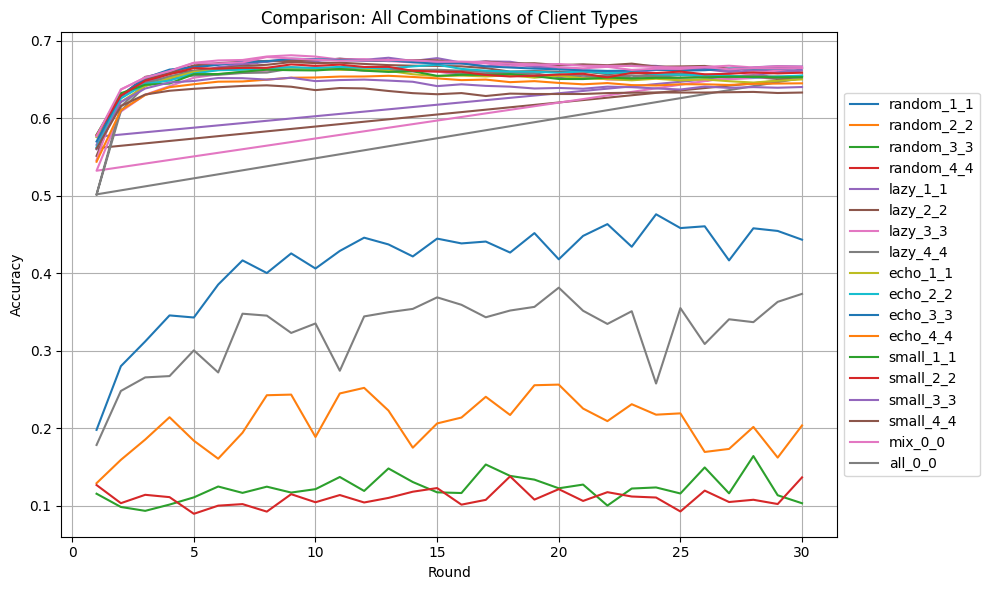

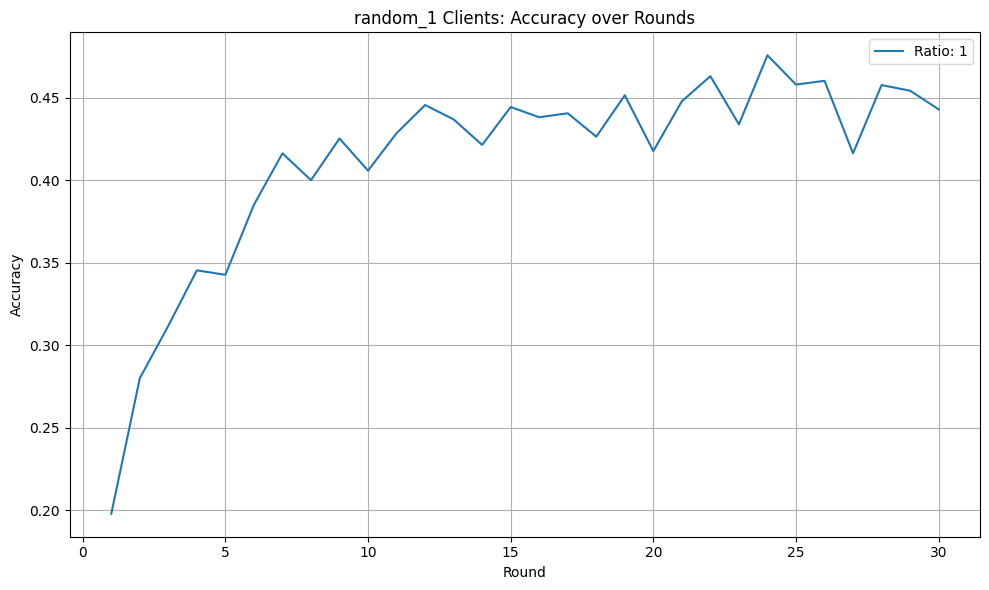

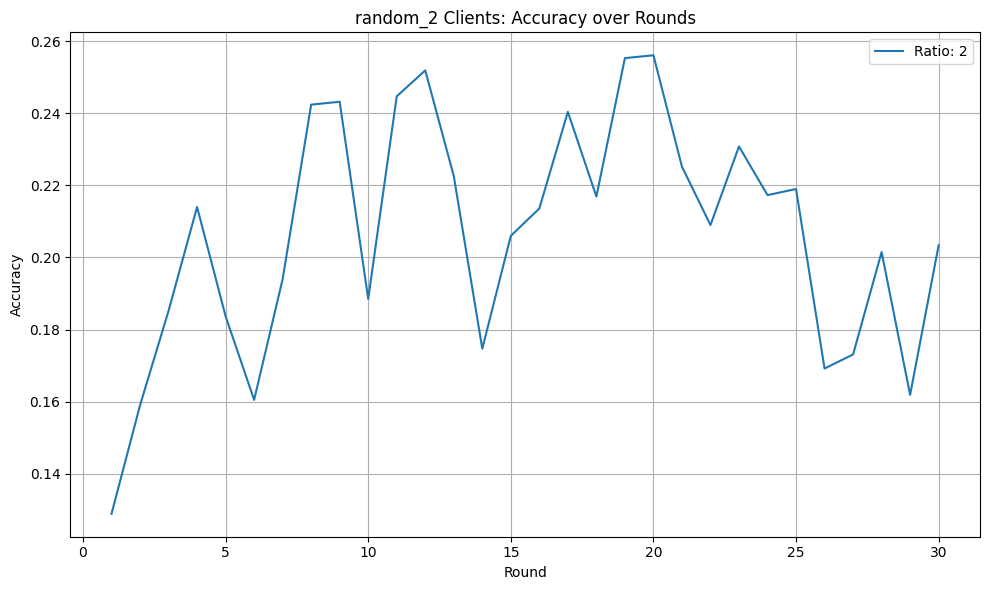

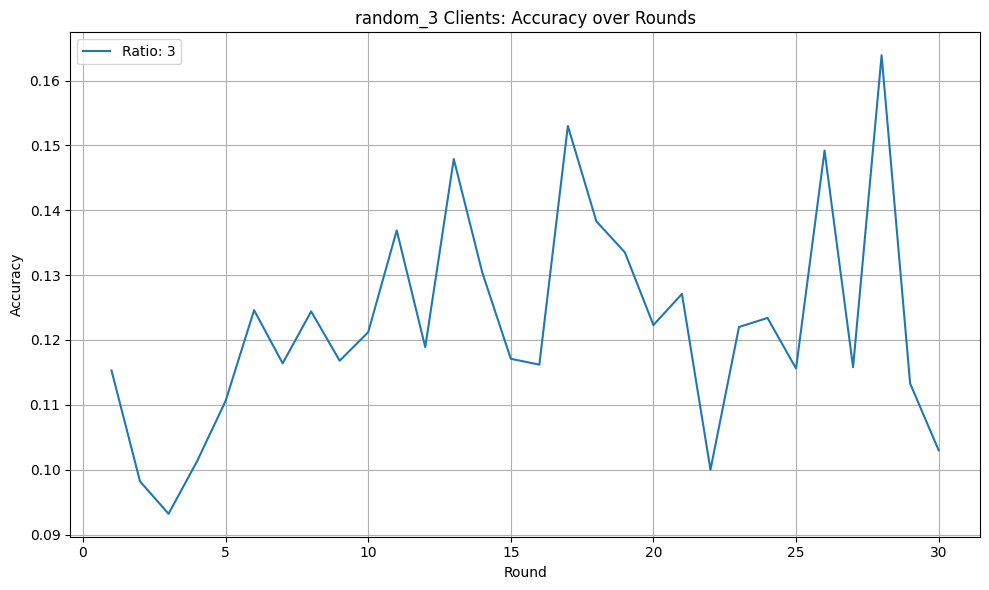

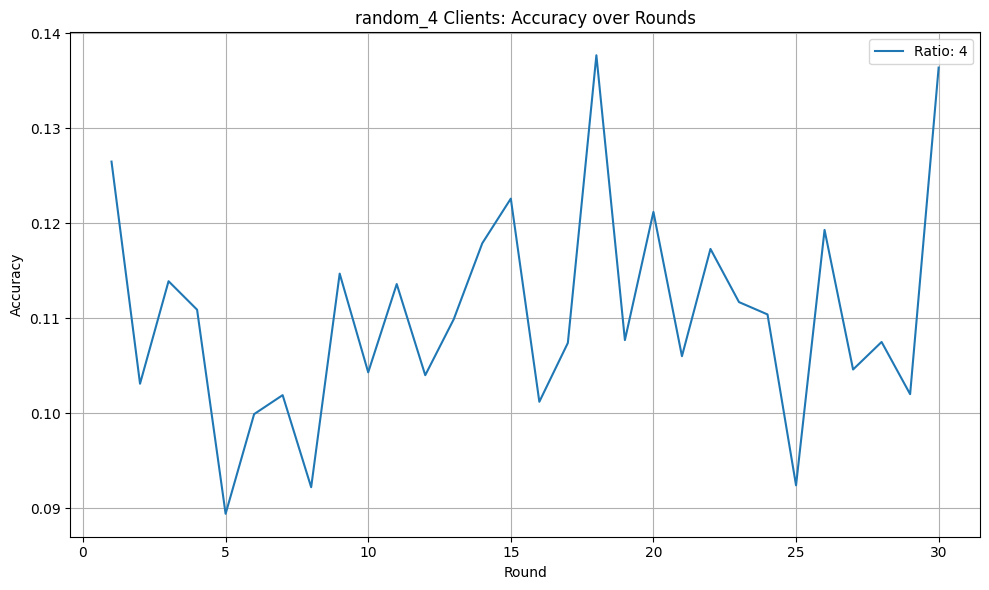

...

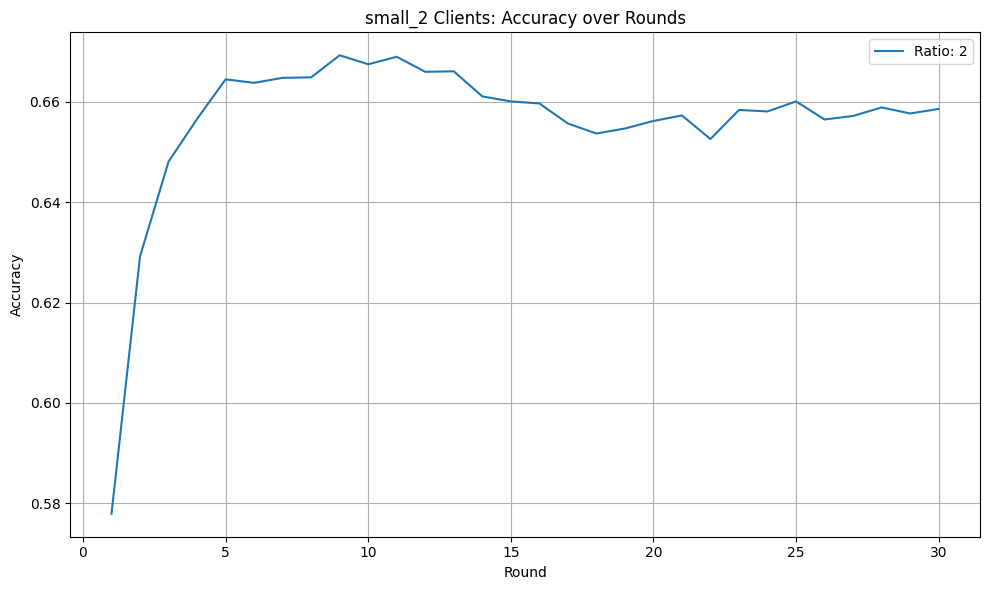

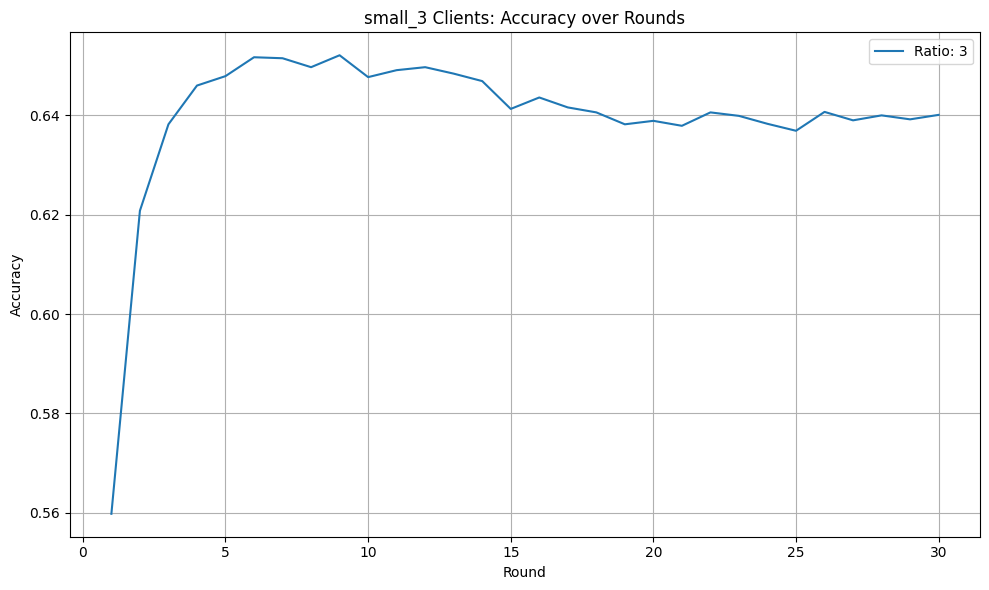

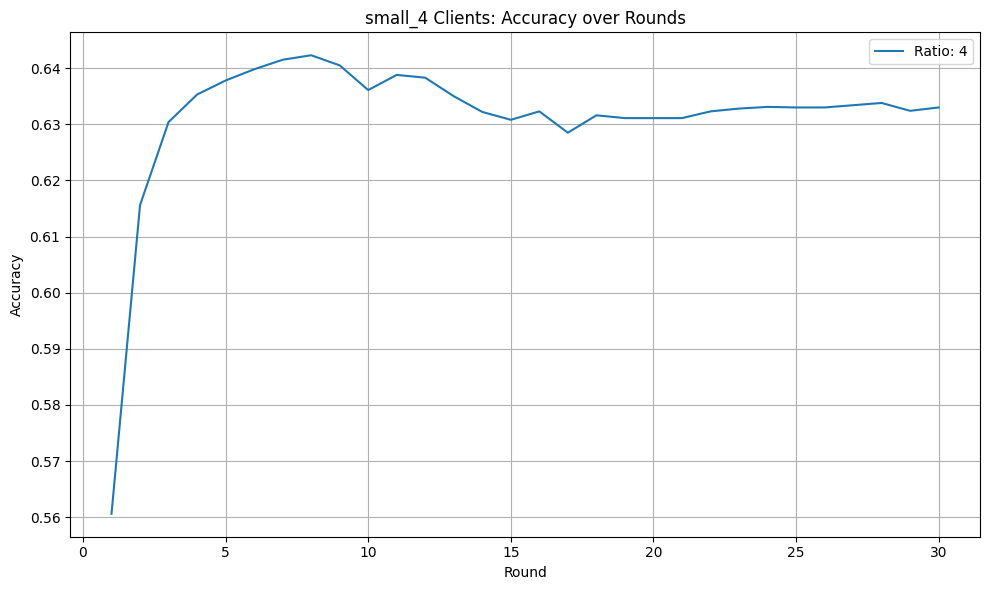

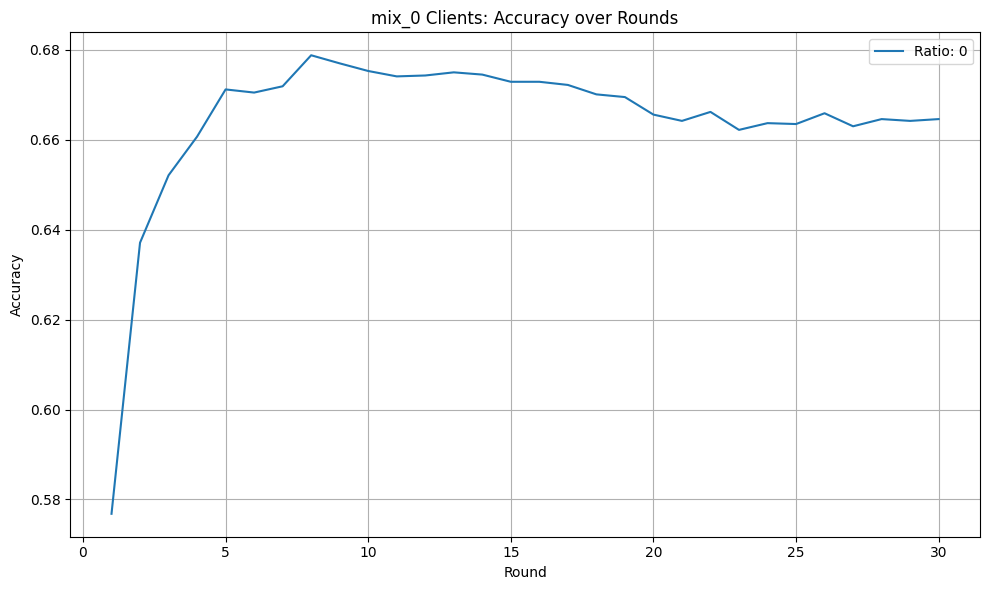

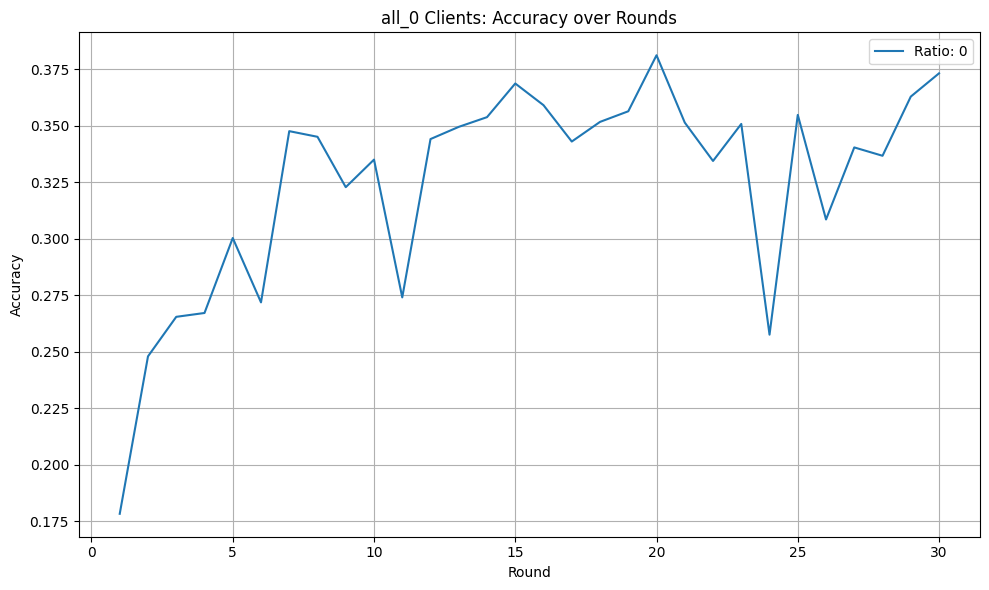

In [ ]:
# ===== 실행 =====
if __name__ == "__main__":
    for num in range(1, 5):  # 0~4 malicious clients
        simulate_with_malicious_clients("random", num, num_rounds=30)
    for num in range(1, 5):  # 0~4 malicious clients
        simulate_with_malicious_clients("lazy", num, num_rounds=30)
    for num in range(1, 5):  # 0~4 malicious clients
        simulate_with_malicious_clients("echo", num, num_rounds=30)
    for num in range(1, 5):  # 0~4 malicious clients
        simulate_with_malicious_clients("small", num, num_rounds=30)
    for num in range(1, 5):  # 0~4 malicious clients
        simulate_with_malicious_clients("lazy", num, num_rounds=30)
    simulate_with_malicious_clients("mix", 0, num_rounds=30)
    simulate_with_malicious_clients("all", 0, num_rounds=30)

    plot_results()

In [21]:
# ===== 실행 =====
if __name__ == "__main__":
    for num in range(5):  # 0~4 malicious clients
        simulate_with_malicious_clients("random", num, num_rounds=30)

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
2025-04-14 09:26:53,996	INFO worker.py:1841 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'accelerator_type:G': 1.0, 'node:__internal_head__': 1.0, 'CPU': 20.0, 'object_store_memory': 4368269721.0, 'node:127.0.0.1': 1.0, 'memory': 8736539444.0, 'GPU': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1}
INFO :      Flower VCE: Creating V

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=8116) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=8116)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=8116)             entirely in future versions of Flower. [repeated 2x across cluster]
(Cli

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=33836) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=33836)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=33836)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=11236) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=11236)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=11236)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=23264) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=23264)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=23264)             entirely in future versions of Flower. [repeated 2x across cluster]
(

In [22]:
# ===== 실행 =====
if __name__ == "__main__":
    for num in range(5):  # 0~4 malicious clients
        simulate_with_malicious_clients("lazy", num, num_rounds=30)

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
2025-04-14 11:30:43,326	INFO worker.py:1841 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'accelerator_type:G': 1.0, 'node:__internal_head__': 1.0, 'CPU': 20.0, 'memory': 9881901467.0, 'node:127.0.0.1': 1.0, 'object_store_memory': 4940950732.0, 'GPU': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1}
INFO :      Flower VCE: Creating V

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=36388) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=36388)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=36388)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=9288) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=9288)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=9288)             entirely in future versions of Flower. [repeated 2x across cluster]
(Cli

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=26992) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=26992)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=26992)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=19796) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=19796)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=19796)             entirely in future versions of Flower. [repeated 2x across cluster]
(

In [23]:
# ===== 실행 =====
if __name__ == "__main__":
    for num in range(5):  # 0~4 malicious clients
        simulate_with_malicious_clients("echo", num, num_rounds=30)

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
2025-04-14 13:41:39,007	INFO worker.py:1841 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'accelerator_type:G': 1.0, 'node:__internal_head__': 1.0, 'CPU': 20.0, 'object_store_memory': 4811288985.0, 'node:127.0.0.1': 1.0, 'memory': 9622577972.0, 'GPU': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1}
INFO :      Flower VCE: Creating V

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=36328) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=36328)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=36328)             entirely in future versions of Flower. [repeated 2x across cluster]
(

(ClientAppActor pid=12464) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=21016) 
(ClientAppActor pid=21016)         
(ClientAppActor pid=37484) 
(ClientAppActor pid=37484)         
(ClientAppActor pid=37484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=37484)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=37484)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=37484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
(ClientAppActor p

(ClientAppActor pid=1492) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=12464) 
(ClientAppActor pid=12464)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=12464) 
(ClientAppActor pid=12464)         
(ClientAppActor pid=12464) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=12464)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=12464)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=12464) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=26852) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=21016) 
(ClientAppActor pid=21016)         
(ClientAppActor pid=21016) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=21016)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=21016)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=21016) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
INFO :      aggre

(ClientAppActor pid=21016) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=1492) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=1492)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=1492)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=1492) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=8052) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=32392) 
(ClientAppActor pid=32392)         
(ClientAppActor pid=32392) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=32392)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=32392)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=32392) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=19784) 
(ClientAppActor pid=19784)         
(ClientAppActor p

(ClientAppActor pid=21016) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=12464) 
(ClientAppActor pid=12464)         
(ClientAppActor pid=12464) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=12464)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=12464)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=12464) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
INFO :      aggrega

(ClientAppActor pid=1492) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=37076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=37076)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=37076)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=37076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=21016) 
(ClientAppActor pid=21016)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=21016) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=32392) 
(ClientAppActor pid=32392)         
(ClientAppActor pid=12464) 
(ClientAppActor pid=12464)         
(ClientAppActor pid=8640) 
(ClientAppActor pid=8640)         
(ClientAppActor pid=8640) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=8640)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=8640)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=8640) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=3

(ClientAppActor pid=19784) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=37484) 
(ClientAppActor pid=37484)         
(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=37076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=37076)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=37076)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=37076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
(ClientAppActor p

(ClientAppActor pid=8640) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=37076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=37076)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=37076)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=37076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=26852) 
(ClientAppActor pid=26852)         
(ClientAppActor p

(ClientAppActor pid=37076) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=32392) 
(ClientAppActor pid=32392)         
(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
(ClientAppActor pid=8052) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=8052)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=8052)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=8052) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=374

(ClientAppActor pid=19784) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=21016) 
(ClientAppActor pid=21016)         
(ClientAppActor pid=21016) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=21016)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=21016)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=21016) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=32392) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=37484) 
(ClientAppActor pid=37484)         
(ClientAppActor pid=21016) 
(ClientAppActor pid=21016)         
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=37076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=37076)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=37076)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=37076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=26852) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=12464) 
(ClientAppActor pid=12464)         
(ClientAppActor pid=12464) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=12464)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=12464)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=12464) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
(ClientAppActor p

(ClientAppActor pid=21016) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=19784) 
(ClientAppActor pid=19784)         
(ClientAppActor pid=19784) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=19784)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=19784)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=19784) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=12464) 
(ClientAppActor pid=12464)         
(ClientAppActor p

(ClientAppActor pid=19784) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=12464) 
(ClientAppActor pid=12464)         
(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
(ClientAppActor pid=26852) 
(ClientAppActor pid=26852)         
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=32392) 
(ClientAppActor pid=32392)         
(ClientAppActor pid=32392) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=32392)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=32392)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=32392) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was r

(ClientAppActor pid=26852) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=21016) 
(ClientAppActor pid=21016)         
(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=8640) 
(ClientAppActor pid=8640)         
(ClientAppActor pid=8640) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=8640)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=8640)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=8640) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returne

(ClientAppActor pid=19784) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
(ClientAppActor pid=8640) 
(ClientAppActor pid=8640)         
(ClientAppActor pid=8640) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=8640)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=8640)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=8640) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=21016

(ClientAppActor pid=32392) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=1492) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=1492)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=1492)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=1492) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=12464) 
(ClientAppActor pid=12464)         
(ClientAppActor pid=2

(ClientAppActor pid=26852) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=8640) 
(ClientAppActor pid=8640)         
(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
(ClientAppActor pid=8052) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=8052)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=8052)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=8052) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to 

(ClientAppActor pid=32392) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=19784) 
(ClientAppActor pid=19784)         
(ClientAppActor pid=12464) 
(ClientAppActor pid=12464)         
(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=37076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=37076)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=37076)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=37076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=32392) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=19784) 
(ClientAppActor pid=19784)         
(ClientAppActor pid=19784) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=19784)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=19784)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=19784) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=32392) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=8640) 
(ClientAppActor pid=8640)         
(ClientAppActor pid=21016) 
(ClientAppActor pid=21016)         
(ClientAppActor pid=21016) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=21016)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=21016)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=21016) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor p

(ClientAppActor pid=8052) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=8640) 
(ClientAppActor pid=8640)         
(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=37076) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=37076)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=37076)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=37076) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=32392) 
(ClientAppActor pid=32392)         
INFO :      aggre

(ClientAppActor pid=37484) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=21016) 
(ClientAppActor pid=21016)         
(ClientAppActor pid=21016) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=21016)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=21016)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=21016) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configu

(ClientAppActor pid=8052) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=26852) 
(ClientAppActor pid=26852)         
(ClientAppActor pid=8640) 
(ClientAppActor pid=8640)         
(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor pid=19784) 
(ClientAppActor pid=19784)         
(ClientAppActor pid=19784) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=19784)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=19784)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=19784) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=8052) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=1492) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=1492)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=1492)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=1492) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAppActor

(ClientAppActor pid=32392) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=37484) 
(ClientAppActor pid=37484)         
(ClientAppActor pid=37484) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=37484)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=37484)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=37484) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8640) 
(ClientAppActor pid=8640)         
(ClientAppActor pid=37076) 
(ClientAppActor pid=37076)         
(ClientAppActor p

(ClientAppActor pid=26852) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=8052) 
(ClientAppActor pid=8052)         
(ClientAppActor pid=8640) 
(ClientAppActor pid=8640)         
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=19784) 
(ClientAppActor pid=19784)         
(ClientAppActor pid=19784) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=19784)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=19784)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=19784) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it

(ClientAppActor pid=8052) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=8640) 
(ClientAppActor pid=8640)         
(ClientAppActor pid=1492) 
(ClientAppActor pid=1492)         
(ClientAppActor pid=32392) 
(ClientAppActor pid=32392)         
(ClientAppActor pid=21016) 
(ClientAppActor pid=21016)         
(ClientAppActor pid=21016) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=21016)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=21016)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=21016) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert 

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=32392) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=32392)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=32392)             entirely in future versions of Flower. [repeated 3x across cluster]
(

(ClientAppActor pid=33788) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=5784) 
(ClientAppActor pid=5784)         
(ClientAppActor pid=36952) 
(ClientAppActor pid=36952)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
(ClientAppActor pid=33572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=33572)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=33572)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=33572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert 

(ClientAppActor pid=28284) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=9952) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=9952)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=9952)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=9952) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=369

(ClientAppActor pid=33788) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=5784) 
(ClientAppActor pid=5784)         
(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=8572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=8572)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=8572)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=8572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
INFO :      aggregate_f

(ClientAppActor pid=36952) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=5784) 
(ClientAppActor pid=5784)         
(ClientAppActor pid=28284) 
(ClientAppActor pid=28284)         
(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
(ClientAppActor pid=25180) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=25180)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=25180)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=25180) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was r

(ClientAppActor pid=25180) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor pid=33788) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=33788)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=33788)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=33788) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=28284) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor pid=5784) 
(ClientAppActor pid=5784)         
(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
(ClientAppActor pid=25180) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=25180)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=25180)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=25180) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was ret

(ClientAppActor pid=18872) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=5784) 
(ClientAppActor pid=5784)         
(ClientAppActor pid=36952) 
(ClientAppActor pid=36952)         
(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor pid=33788) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=33788)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=33788)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=33788) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor p

(ClientAppActor pid=5784) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=36952) 
(ClientAppActor pid=36952)         
(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor pid=28284) 
(ClientAppActor pid=28284)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=9952) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=9952)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=9952)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=9952) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it

(ClientAppActor pid=9952) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=18872) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=18872)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=18872)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=18872) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=18872) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28284) 
(ClientAppActor pid=28284)         
(ClientAppActor pid=28284) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=28284)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=28284)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=28284) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
(ClientAppActor

(ClientAppActor pid=5784) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
(ClientAppActor pid=25180) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=25180)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=25180)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=25180) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor

(ClientAppActor pid=9952) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=18872) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=18872)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=18872)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=18872) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=33572) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor pid=36952) 
(ClientAppActor pid=36952)         
(ClientAppActor pid=36952) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=36952)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=36952)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=36952) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
(ClientAppActor

(ClientAppActor pid=25180) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=36952) 
(ClientAppActor pid=36952)         
(ClientAppActor pid=28284) 
(ClientAppActor pid=28284)         
(ClientAppActor pid=28284) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=28284)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=28284)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=28284) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=33572) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=28284) 
(ClientAppActor pid=28284)         
(ClientAppActor pid=28284) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=28284)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=28284)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=28284) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=25180) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
(ClientAppActor pid=33572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=33572)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=33572)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=33572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor p

(ClientAppActor pid=28284) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=8572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=8572)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=8572)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=8572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=188

(ClientAppActor pid=34700) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=5784) 
(ClientAppActor pid=5784)         
(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
(ClientAppActor pid=33572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=33572)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=33572)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=33572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
INFO :      aggre

(ClientAppActor pid=8572) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
(ClientAppActor pid=34700) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=34700)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=34700)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=34700) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=33788) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
(ClientAppActor pid=25180) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=25180)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=25180)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=25180) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor p

(ClientAppActor pid=33572) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
(ClientAppActor pid=5784) 
(ClientAppActor pid=5784)         
(ClientAppActor pid=5784) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=5784)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=5784)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=5784) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returne

(ClientAppActor pid=34700) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=5784) 
(ClientAppActor pid=5784)         
(ClientAppActor pid=5784) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=5784)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=5784)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=5784) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returne

(ClientAppActor pid=28284) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=36952) 
(ClientAppActor pid=36952)         
(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
(ClientAppActor pid=33572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=33572)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=33572)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=33572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor p

(ClientAppActor pid=9952) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
(ClientAppActor pid=34700) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=34700)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=34700)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=34700) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=9952) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=5784) 
(ClientAppActor pid=5784)         
(ClientAppActor pid=5784) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=5784)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=5784)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=5784) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=369

(ClientAppActor pid=34700) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
(ClientAppActor pid=25180) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=25180)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=25180)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=25180) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=28284) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=9952) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=9952)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=9952)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=9952) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=34700) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=28284) 
(ClientAppActor pid=28284)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=8572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=8572)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=8572)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=8572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=5784) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=9952) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=9952)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=9952)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=9952) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=8

(ClientAppActor pid=34700) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=36952) 
(ClientAppActor pid=36952)         
(ClientAppActor pid=28284) 
(ClientAppActor pid=28284)         
(ClientAppActor pid=28284) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=28284)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=28284)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=28284) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor

(ClientAppActor pid=28284) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=9952) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=9952)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=9952)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=9952) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=188

(ClientAppActor pid=25180) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
(ClientAppActor pid=34700) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=34700)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=34700)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=34700) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=5784) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
(ClientAppActor pid=34700) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=34700)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=34700)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=34700) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=8572) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=25180) 
(ClientAppActor pid=25180)         
(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor pid=9952) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=9952)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=9952)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=9952) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=3

(ClientAppActor pid=34700) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=36952) 
(ClientAppActor pid=36952)         
(ClientAppActor pid=36952) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=36952)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=36952)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=36952) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=5784) 
(ClientAppActor pid=5784)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configu

(ClientAppActor pid=33572) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor pid=33788) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=33788)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=33788)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=33788) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=28284) 
(ClientAppActor pid=28284)         
(ClientAppActor pid=9952) 
(ClientAppActor pid=9952)         
(ClientAppActor p

(ClientAppActor pid=34700) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=36952) 
(ClientAppActor pid=36952)         
(ClientAppActor pid=36952) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=36952)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=36952)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=36952) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=36952) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
(ClientAppActor pid=33572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=33572)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=33572)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=33572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyCli

(ClientAppActor pid=25180) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=28284) 
(ClientAppActor pid=28284)         
(ClientAppActor pid=28284) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=28284)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=28284)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=28284) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=18872) 
(ClientAppActor pid=18872)         
(ClientAppActor pid=33788) 
(ClientAppActor pid=33788)         
(ClientAppActor

(ClientAppActor pid=9952) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=34700) 
(ClientAppActor pid=34700)         
(ClientAppActor pid=8572) 
(ClientAppActor pid=8572)         
(ClientAppActor pid=8572) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=8572)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=8572)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=8572) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=33572) 
(ClientAppActor pid=33572)         
INFO :      aggregate

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=25180) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=25180)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=25180)             entirely in future versions of Flower. [repeated 2x across cluster]
(

(ClientAppActor pid=30788) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=3396) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=3396)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=3396)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=3396) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=1

(ClientAppActor pid=8584) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=33460) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=33460)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=33460)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=33460) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=23988) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=18352) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=18352)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=18352)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=18352) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=18352) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=34280) 
(ClientAppActor pid=34280)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=3396) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=3396)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=3396)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=3396) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it t

(ClientAppActor pid=30788) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=33460) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=33460)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=33460)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=33460) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=34280) 
(ClientAppActor pid=34280)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor p

(ClientAppActor pid=18352) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=23988) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=23988)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=23988)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=23988) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=34280) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=3396) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=3396)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=3396)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=3396) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         


(ClientAppActor pid=25516) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=18352) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=18352)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=18352)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=18352) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=25516) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=3396) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 7x across cluster]
(ClientAppActor pid=3396)             This is a deprecated feature. It will be removed [repeated 7x across cluster]
(ClientAppActor pid=3396)             entirely in future versions of Flower. [repeated 7x across cluster]
(ClientAppActor pid=3396) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it

(ClientAppActor pid=33460) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=34280) 
(ClientAppActor pid=34280)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=34280) 
(ClientAppActor pid=34280)         
(ClientAppActor pid=34280) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=34280)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=34280)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=34280) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyCli

(ClientAppActor pid=33460) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         


(ClientAppActor pid=12692) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=18352) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=18352)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=18352)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=18352) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor p

(ClientAppActor pid=25516) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=13324) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=13324)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=13324)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=13324) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=30788) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=12692) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=12692)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=12692)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=12692) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
INFO :      agg

(ClientAppActor pid=18352) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=13324) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=13324)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=13324)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=13324) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor p

(ClientAppActor pid=30788) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=3396) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=3396)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=3396)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=3396) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=8

(ClientAppActor pid=34280) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=25516) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=25516)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=25516)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=25516) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor p

(ClientAppActor pid=34280) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=3396) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 7x across cluster]
(ClientAppActor pid=3396)             This is a deprecated feature. It will be removed [repeated 7x across cluster]
(ClientAppActor pid=3396)             entirely in future versions of Flower. [repeated 7x across cluster]
(ClientAppActor pid=3396) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it t

(ClientAppActor pid=18352) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=33460) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=33460)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=33460)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=33460) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAp

(ClientAppActor pid=30788) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=23988) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=23988)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=23988)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=23988) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]


(ClientAppActor pid=23988) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=3396) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=3396)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=3396)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=3396) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was retur

(ClientAppActor pid=34280) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=23988) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23988)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23988)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23988) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was

(ClientAppActor pid=13324) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=12692) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=12692)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=12692)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=12692) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was r

(ClientAppActor pid=18352) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=34280) 
(ClientAppActor pid=34280)         
(ClientAppActor pid=34280) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=34280)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=34280)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=34280) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor

(ClientAppActor pid=34280) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=8584) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=8584)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=8584)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=8584) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was retur

(ClientAppActor pid=33460) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=13324) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=13324)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=13324)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=13324) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=23988) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=34280) 
(ClientAppActor pid=34280)         
(ClientAppActor pid=34280) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=34280)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=34280)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=34280) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=18352) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=12692) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=12692)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=12692)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=12692) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor p

(ClientAppActor pid=13324) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=8584) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=8584)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=8584)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=8584) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=3

(ClientAppActor pid=34280) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
(ClientAppActor pid=30788) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=30788)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=30788)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=30788) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor p

(ClientAppActor pid=33460) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=8584) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=8584)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=8584)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=8584) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it

(ClientAppActor pid=25516) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=13324) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=13324)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=13324)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=13324) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=13324) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=33460) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=33460)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=33460)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=33460) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=23988) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=18352) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=18352)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=18352)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=18352) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         


(ClientAppActor pid=18352) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=34280) 
(ClientAppActor pid=34280)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=3396) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=3396)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=3396)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=3396) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it

(ClientAppActor pid=25516) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=3396) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=3396)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=3396)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=3396) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAppActor

(ClientAppActor pid=34280) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=12692) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=12692)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=12692)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=12692) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
(ClientAppActor p

(ClientAppActor pid=12692) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=25516) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=25516)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=25516)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=25516) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
(ClientAppActor p

(ClientAppActor pid=30788) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=18352) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=18352)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=18352)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=18352) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was r

(ClientAppActor pid=34280) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor pid=25516) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=25516)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=25516)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=25516) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was r

(ClientAppActor pid=8584) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
(ClientAppActor pid=30788) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=30788)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=30788)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=30788) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=23988) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=3396) 
(ClientAppActor pid=3396)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=13324) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=13324)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=13324)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=13324) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=25516) 
(ClientAppActor pid=25516)         
(ClientAppActor p

(ClientAppActor pid=25516) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=8584) 
(ClientAppActor pid=8584)         
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=33460) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=33460)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=33460)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=33460) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor p

(ClientAppActor pid=3396) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
(ClientAppActor pid=18352) 
(ClientAppActor pid=18352)         
(ClientAppActor pid=18352) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=18352)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=18352)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=18352) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor

(ClientAppActor pid=34280) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=33460) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=33460)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=33460)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=33460) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor

(ClientAppActor pid=3396) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=33460) 
(ClientAppActor pid=33460)         
(ClientAppActor pid=12692) 
(ClientAppActor pid=12692)         
(ClientAppActor pid=30788) 
(ClientAppActor pid=30788)         
(ClientAppActor pid=30788) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=30788)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=30788)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=30788) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=8584) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=13324) 
(ClientAppActor pid=13324)         
(ClientAppActor pid=23988) 
(ClientAppActor pid=23988)         
(ClientAppActor pid=23988) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=23988)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=23988)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=23988) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=34280) 
(ClientAppActor pid=34280)         
INFO :      agg

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=23988) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=23988)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=23988)             entirely in future versions of Flower. [repeated 2x across cluster]
(

(ClientAppActor pid=18000) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=20528) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=20528)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=20528)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=20528) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor

(ClientAppActor pid=35416) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=27580) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=27580)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=27580)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=27580) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=8612) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=21764) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=21764)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=21764)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=21764) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         


(ClientAppActor pid=21764) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=32908) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=32908)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=32908)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=32908) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=21764) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=20528) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=20528)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=20528)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=20528) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor

(ClientAppActor pid=28256) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 4x across cluster]


(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=35416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=35416)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=35416)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=35416) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=18000) 
(ClientAppActor pid=18000)         
(ClientAppActor

(ClientAppActor pid=21764) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=20528) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=20528)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=20528)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=20528) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=8612) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=34188) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=34188)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=34188)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=34188) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor

(ClientAppActor pid=32908) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=27580) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=27580)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=27580)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=27580) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=34188) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=18000) 
(ClientAppActor pid=18000)         
(ClientAppActor pid=18000) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=18000)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=18000)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=18000) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor

(ClientAppActor pid=27580) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=32908) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=32908)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=32908)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=32908) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
INFO :      aggre

(ClientAppActor pid=32908) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=18000) 
(ClientAppActor pid=18000)         
(ClientAppActor pid=18000) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=18000)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=18000)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=18000) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor p

(ClientAppActor pid=36900) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=27580) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=27580)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=27580)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=27580) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 3x across cluster]
(ClientAp

(ClientAppActor pid=32908) [EchoClient] Round 1: returning current parameters (initial phase)
(ClientAppActor pid=8612) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=18000) 
(ClientAppActor pid=18000)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=27580) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=27580)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=27580)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=27580) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=27580) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=34188) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=34188)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=34188)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=34188) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=8612) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=20528) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=20528)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=20528)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=20528) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]


(ClientAppActor pid=20528) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=18000) 
(ClientAppActor pid=18000)         
(ClientAppActor pid=18000) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=18000)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=18000)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=18000) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=18000) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=32908) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=32908)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=32908)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=32908) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=18000) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=34188) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=34188)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=34188)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=34188) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         


(ClientAppActor pid=34188) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=20528) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=20528)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=20528)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=20528) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=34188) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=35416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=35416)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=35416)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=35416) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor

(ClientAppActor pid=8612) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=27580) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=27580)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=27580)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=27580) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=8612) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=20528) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=20528)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=20528)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=20528) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]


(ClientAppActor pid=21764) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=32908) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=32908)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=32908)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=32908) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=21764) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=34188) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 7x across cluster]
(ClientAppActor pid=34188)             This is a deprecated feature. It will be removed [repeated 7x across cluster]
(ClientAppActor pid=34188)             entirely in future versions of Flower. [repeated 7x across cluster]
(ClientAppActor pid=34188) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 7x across cluster]
(ClientAppActor

(ClientAppActor pid=32908) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
(ClientAppActor pid=8612) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=8612)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=8612)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=8612) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was

(ClientAppActor pid=34188) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=35416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=35416)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=35416)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=35416) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=18000) 
(ClientAppActor pid=18000)         
(ClientAppActor

(ClientAppActor pid=32908) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=21764) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=21764)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=21764)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=21764) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=34188) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=32908) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=32908)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=32908)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=32908) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=35416) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=18000) 
(ClientAppActor pid=18000)         
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=36900) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=36900)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=36900)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=36900) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conver

(ClientAppActor pid=20528) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=32908) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=32908)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=32908)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=32908) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
(ClientAppActor p

(ClientAppActor pid=36900) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=35416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=35416)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=35416)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=35416) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         


(ClientAppActor pid=35416) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=21764) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=21764)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=21764)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=21764) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=32908) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=34188) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=34188)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=34188)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=34188) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
(ClientAppActor p

(ClientAppActor pid=21764) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=35416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=35416)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=35416)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=35416) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=36900) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=18000) 
(ClientAppActor pid=18000)         
(ClientAppActor pid=18000) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=18000)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=18000)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=18000) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor

(ClientAppActor pid=21764) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=32908) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=32908)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=32908)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=32908) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=18000) [EchoClient] Round 1: returning current parameters (initial phase)
(ClientAppActor pid=34188) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=36900) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=36900)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=36900)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=36900) WARNING :   Deprecation Warning: The `client_fn` function must re

(ClientAppActor pid=18000) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=20528) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 7x across cluster]
(ClientAppActor pid=20528)             This is a deprecated feature. It will be removed [repeated 7x across cluster]
(ClientAppActor pid=20528)             entirely in future versions of Flower. [repeated 7x across cluster]
(ClientAppActor pid=20528) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was

(ClientAppActor pid=28256) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=36900) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=36900)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=36900)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=36900) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyCli

(ClientAppActor pid=28256) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=20528) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=20528)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=20528)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=20528) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]


(ClientAppActor pid=20528) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=34188) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=34188)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=34188)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=34188) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was

(ClientAppActor pid=34188) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=18000) 
(ClientAppActor pid=18000)         
(ClientAppActor pid=18000) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=18000)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=18000)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=18000) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=32908) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         


(ClientAppActor pid=34188) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=27580) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=27580)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=27580)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=27580) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
(ClientAppActor p

(ClientAppActor pid=18000) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=34188) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=34188)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=34188)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=34188) WARNING :   Deprecation Warning: The `client_fn` function must retu

(ClientAppActor pid=34188) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=32908) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=32908)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=32908)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=32908) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=27580) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=34188) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=34188)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=34188)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=34188) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         


(ClientAppActor pid=34188) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=36900) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=36900)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=36900)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=36900) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=20528) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=36900) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 7x across cluster]
(ClientAppActor pid=36900)             This is a deprecated feature. It will be removed [repeated 7x across cluster]
(ClientAppActor pid=36900)             entirely in future versions of Flower. [repeated 7x across cluster]
(ClientAppActor pid=36900) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 7x across cluster]
(ClientAppActor

(ClientAppActor pid=8612) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=27580) 
(ClientAppActor pid=27580)         
(ClientAppActor pid=27580) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=27580)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=27580)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=27580) WARNING :   Deprecation Warning: The `client_fn` function m

(ClientAppActor pid=8612) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         


(ClientAppActor pid=32908) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=18000) 
(ClientAppActor pid=18000)         
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=34188) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=34188)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=34188)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=34188) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor

(ClientAppActor pid=18000) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=34188) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=34188)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=34188)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=34188) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor

(ClientAppActor pid=32908) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
(ClientAppActor pid=8612) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context`
(ClientAppActor pid=8612)             This is a deprecated feature. It will be removed
(ClientAppActor pid=8612)             entirely in future versions of Flower.
(ClientAppActor pid=8612) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`.
(ClientAppActor pid=27580) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.Th

(ClientAppActor pid=27580) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         


(ClientAppActor pid=28256) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=36900) 
(ClientAppActor pid=36900)         
(ClientAppActor pid=21764) 
(ClientAppActor pid=21764)         
(ClientAppActor pid=21764) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=21764)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=21764)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=21764) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor

(ClientAppActor pid=8612) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 3x across cluster]


(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=35416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=35416)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=35416)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=35416) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=20528) 
(ClientAppActor pid=20528)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor

(ClientAppActor pid=21764) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 4x across cluster]


(ClientAppActor pid=35416) 
(ClientAppActor pid=35416)         
(ClientAppActor pid=35416) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=35416)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=35416)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=35416) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=34188) 
(ClientAppActor pid=34188)         
(ClientAppActor pid=32908) 
(ClientAppActor pid=32908)         
(ClientAppActor

(ClientAppActor pid=27580) [EchoClient] Round 1: returning current parameters (initial phase) [repeated 2x across cluster]


(ClientAppActor pid=28256) 
(ClientAppActor pid=28256)         
(ClientAppActor pid=28256) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=28256)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=28256)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=28256) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=8612) 
(ClientAppActor pid=8612)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configu

In [24]:
# ===== 실행 =====
if __name__ == "__main__":
    for num in range(5):  # 0~4 malicious clients
        simulate_with_malicious_clients("small", num, num_rounds=30)

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
2025-04-14 15:47:07,144	INFO worker.py:1841 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'accelerator_type:G': 1.0, 'node:__internal_head__': 1.0, 'CPU': 20.0, 'memory': 9455748711.0, 'node:127.0.0.1': 1.0, 'object_store_memory': 4727874355.0, 'GPU': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1}
INFO :      Flower VCE: Creating V

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=27820) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=27820)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=27820)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=30408) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=30408)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=30408)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=20684) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=20684)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=20684)             entirely in future versions of Flower. [repeated 2x across cluster]
(

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
(ClientAppActor pid=21676) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=21676)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=21676)             entirely in future versions of Flower. [repeated 2x across cluster]
(

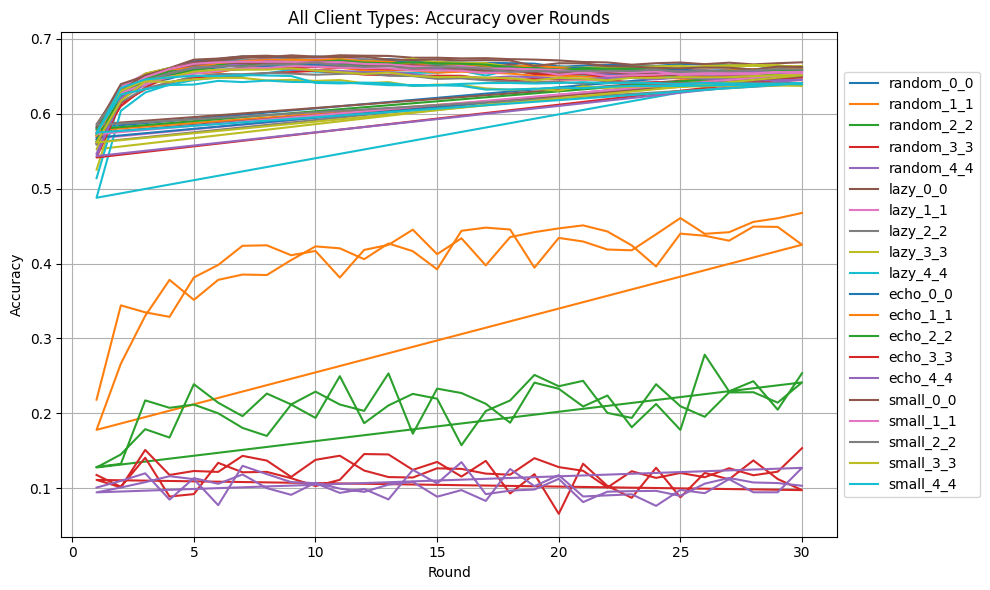

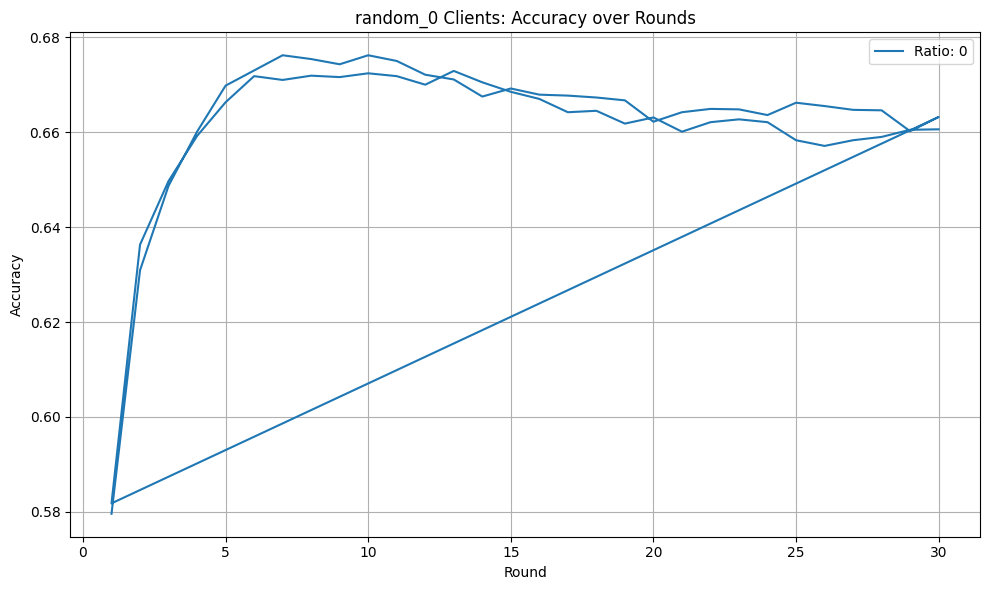

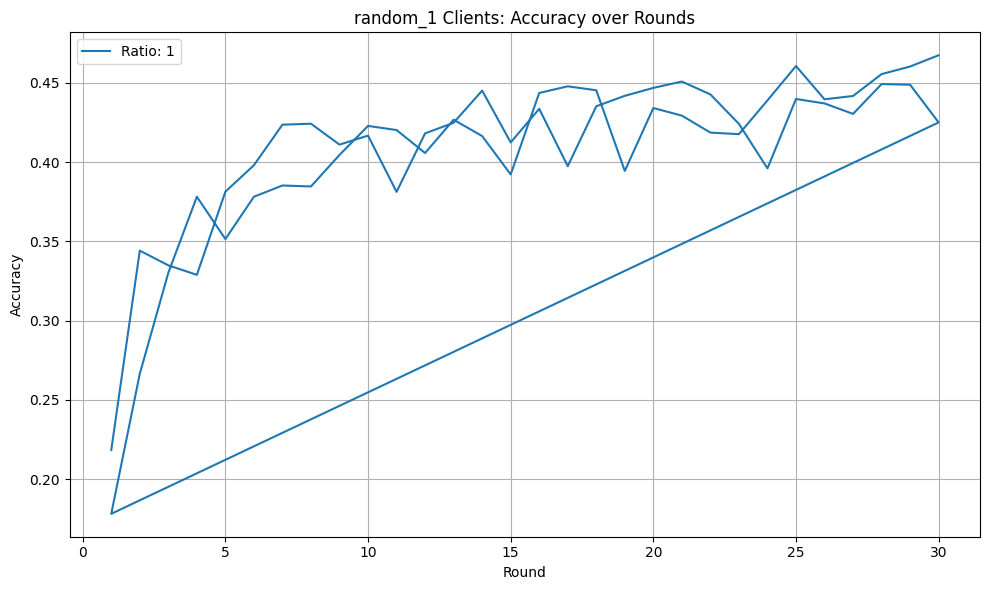

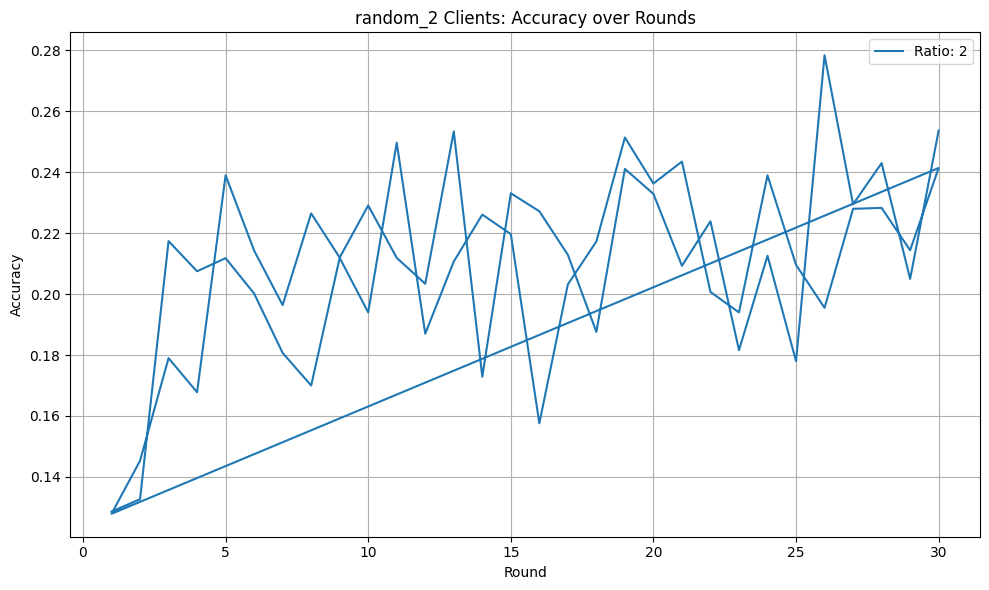

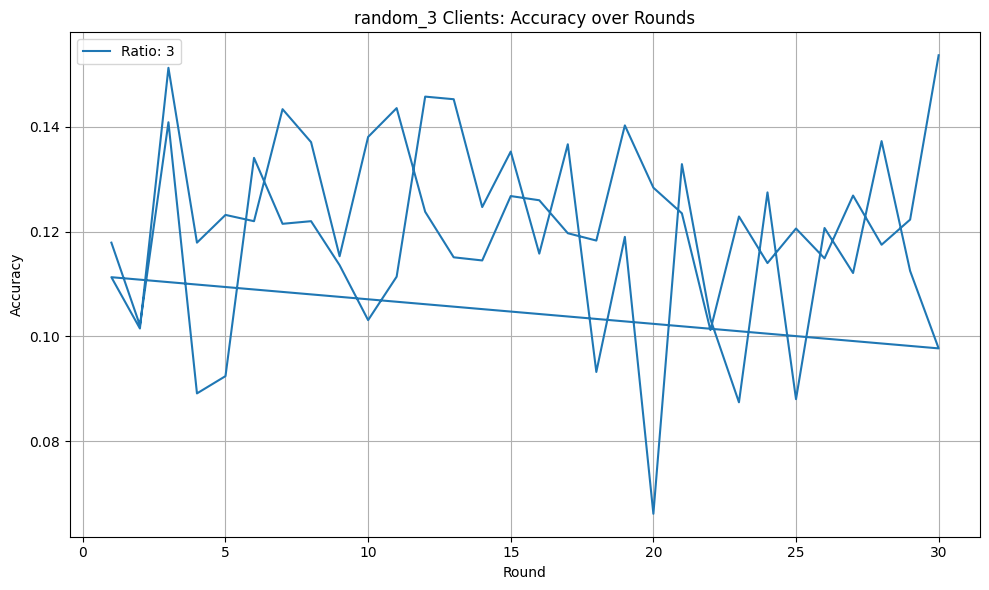

...

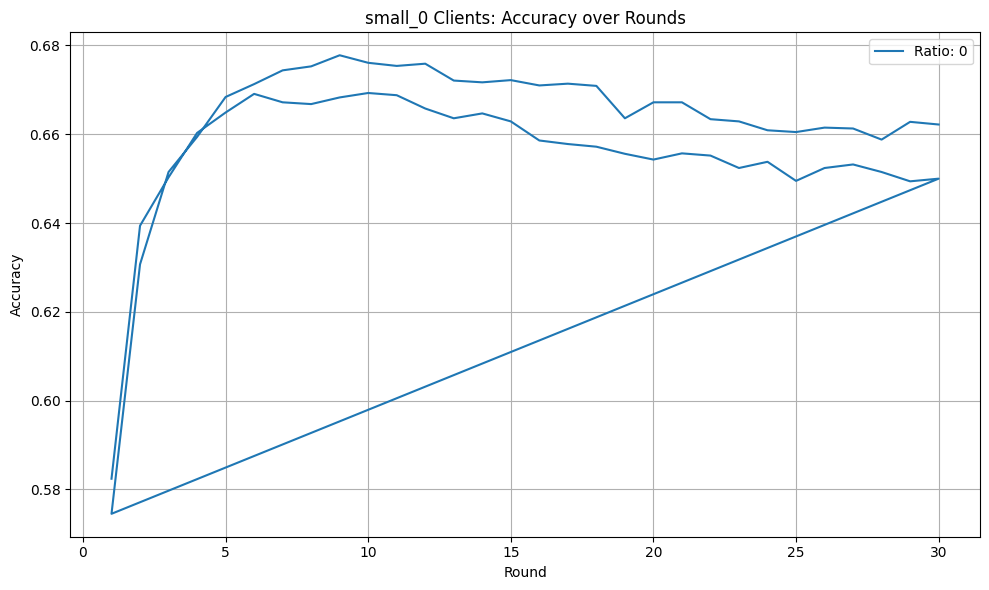

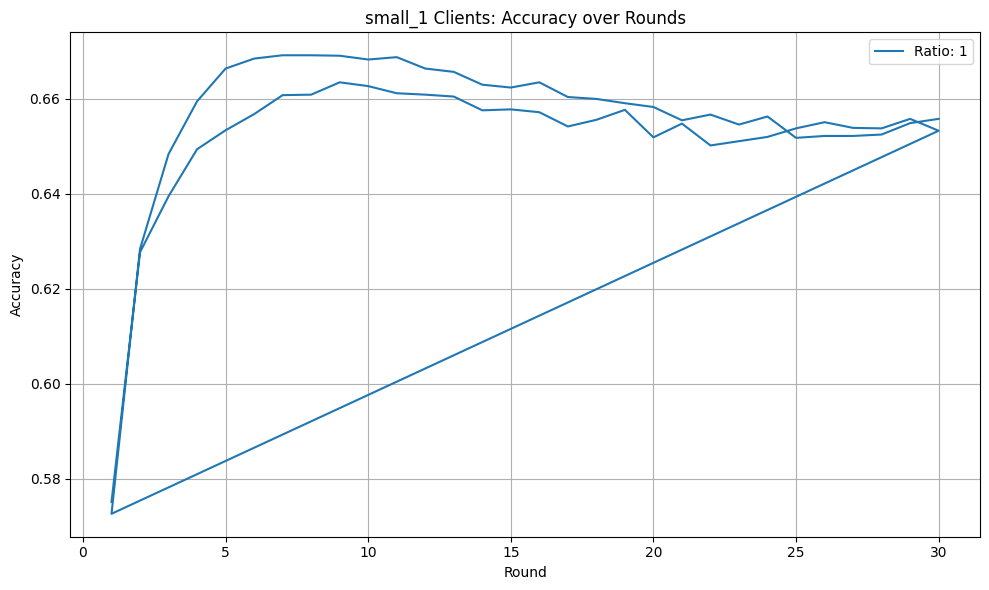

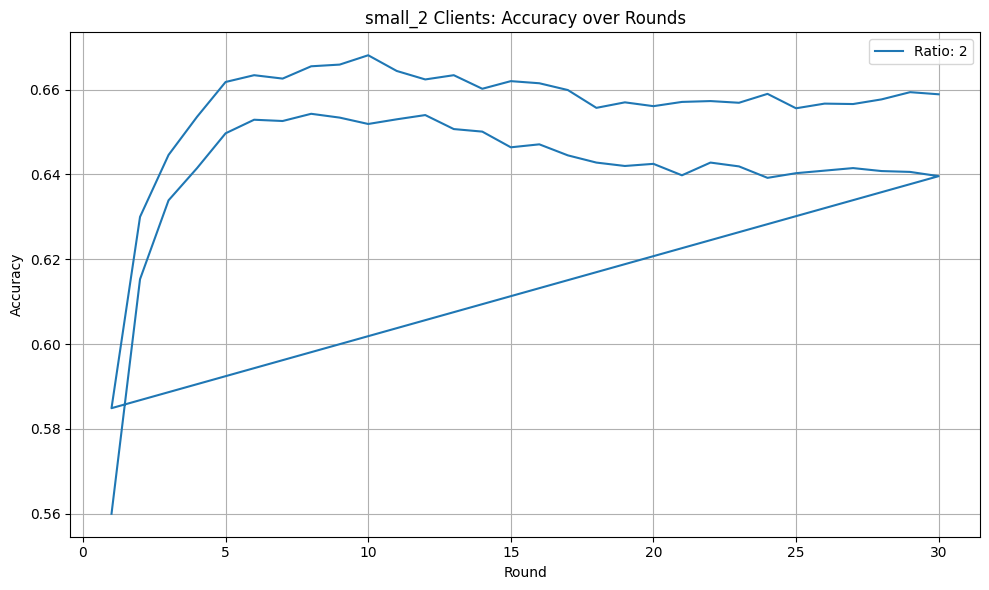

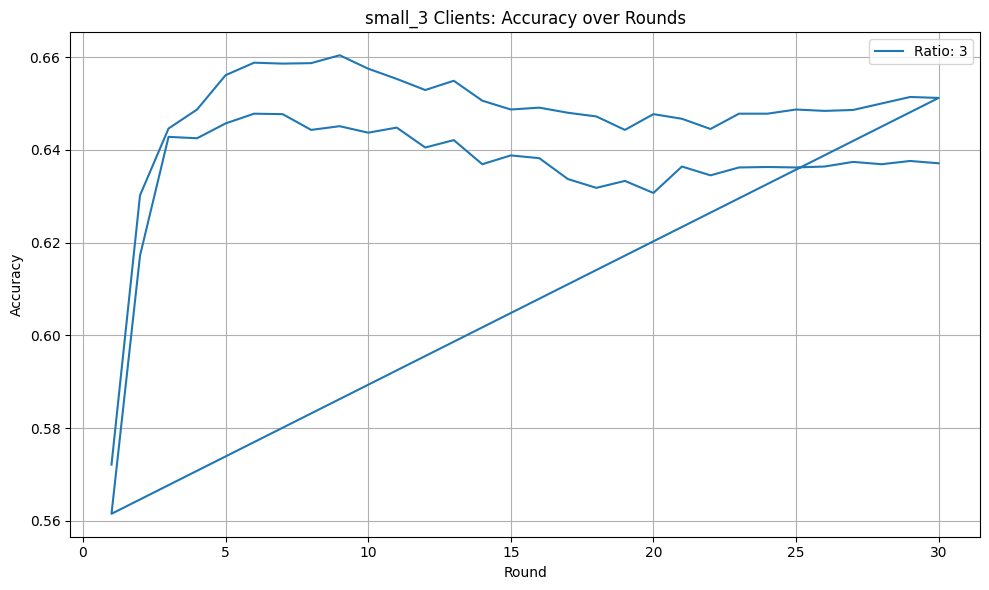

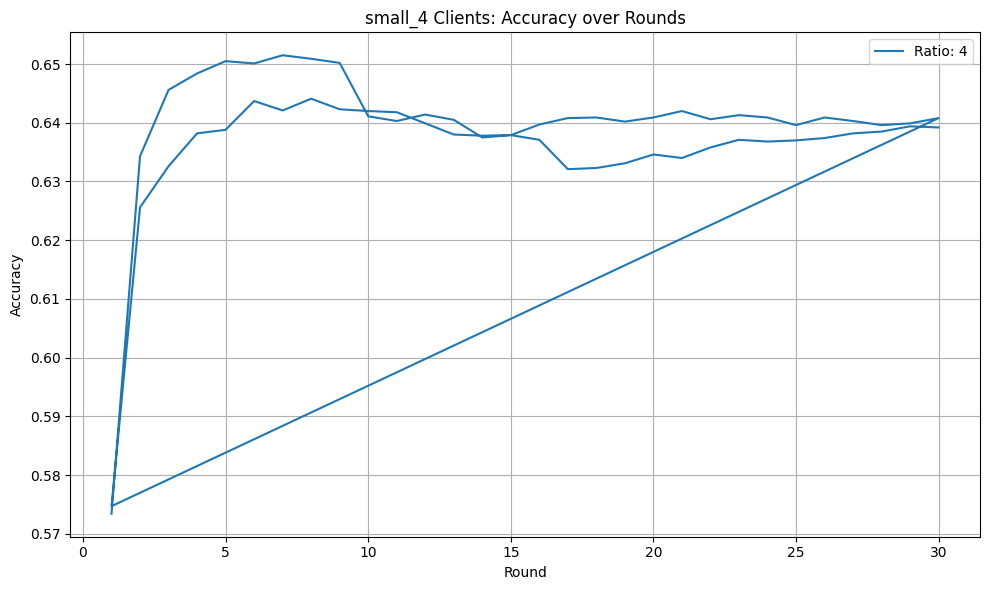

In [25]:
plot_results()

In [29]:
# ===== 정상 시뮬레이션 =====
simulate_with_malicious_clients("mix", 0, num_rounds=30)

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
2025-04-15 00:22:02,952	INFO worker.py:1841 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'accelerator_type:G': 1.0, 'node:__internal_head__': 1.0, 'CPU': 20.0, 'memory': 9281128859.0, 'node:127.0.0.1': 1.0, 'object_store_memory': 4640564428.0, 'GPU': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1}
INFO :      Flower VCE: Creating V

In [31]:
# ===== 복합 시뮬레이션 =====
simulate_with_malicious_clients("all", 0, num_rounds=30)

Files already downloaded and verified


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=30, no round_timeout
2025-04-15 00:50:13,084	INFO worker.py:1841 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'accelerator_type:G': 1.0, 'node:__internal_head__': 1.0, 'CPU': 20.0, 'memory': 9160566375.0, 'node:127.0.0.1': 1.0, 'object_store_memory': 4580283187.0, 'GPU': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1}
INFO :      Flower VCE: Creating V

(ClientAppActor pid=22896) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=31184) 
(ClientAppActor pid=31184)         
(ClientAppActor pid=31184) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=31184)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=31184)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=31184) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=25372) 
(ClientAppActor pid=25372)         
(ClientAppActor

(ClientAppActor pid=22896) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=28688) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=28688)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=28688)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=28688) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=22724) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=22456) 
(ClientAppActor pid=22456)         
(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=25092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=25092)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=25092)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=25092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor

(ClientAppActor pid=32640) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=25372) 
(ClientAppActor pid=25372)         
(ClientAppActor pid=22896) 
(ClientAppActor pid=22896)         
(ClientAppActor pid=31184) 
(ClientAppActor pid=31184)         
(ClientAppActor pid=31184) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=31184)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=31184)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=31184) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=31184) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22724) 
(ClientAppActor pid=22724)         
(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=26432) 
(ClientAppActor pid=26432)         
(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=28688) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=28688)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=28688)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=28688) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=28688) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22724) 
(ClientAppActor pid=22724)         
(ClientAppActor pid=26432) 
(ClientAppActor pid=26432)         
(ClientAppActor pid=26432) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=26432)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=26432)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=26432) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=31184) 
(ClientAppActor pid=31184)         
INFO :      agg

(ClientAppActor pid=22456) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=32640) 
(ClientAppActor pid=32640)         
(ClientAppActor pid=22456) 
(ClientAppActor pid=22456)         
(ClientAppActor pid=22456) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=22456)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=22456)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=22456) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=31184) 
(ClientAppActor pid=31184)         
(ClientAppActor

(ClientAppActor pid=22456) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=31184) 
(ClientAppActor pid=31184)         
(ClientAppActor pid=31576) 
(ClientAppActor pid=31576)         
(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=26432) 
(ClientAppActor pid=26432)         
(ClientAppActor pid=26432) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=26432)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=26432)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=26432) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=22896) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=22456) 
(ClientAppActor pid=22456)         
(ClientAppActor pid=22456) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=22456)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=22456)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=22456) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=22896) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22456) 
(ClientAppActor pid=22456)         
(ClientAppActor pid=22724) 
(ClientAppActor pid=22724)         
(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=25092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 4x across cluster]
(ClientAppActor pid=25092)             This is a deprecated feature. It will be removed [repeated 4x across cluster]
(ClientAppActor pid=25092)             entirely in future versions of Flower. [repeated 4x across cluster]
(ClientAppActor pid=25092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 4x across cluster]
(ClientAppActor

(ClientAppActor pid=26432) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22456) 
(ClientAppActor pid=22456)         
(ClientAppActor pid=31576) 
(ClientAppActor pid=31576)         
(ClientAppActor pid=22724) 
(ClientAppActor pid=22724)         
(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=25092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=25092)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=25092)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=25092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=25092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22456) 
(ClientAppActor pid=22456)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=22456) 
(ClientAppActor pid=22456)         
(ClientAppActor pid=22456) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=22456)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=22456)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=22456) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=26432) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22896) 
(ClientAppActor pid=22896)         
(ClientAppActor pid=22896) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=22896)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=22896)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=22896) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=25372) 
(ClientAppActor pid=25372)         
(ClientAppActor pid=22456) 
(ClientAppActor pid=22456)         
(ClientAppActor

(ClientAppActor pid=22896) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=22456) 
(ClientAppActor pid=22456)         
(ClientAppActor pid=31184) 
(ClientAppActor pid=31184)         
(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=32640) 
(ClientAppActor pid=32640)         
(ClientAppActor pid=32640) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=32640)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=32640)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=32640) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=25092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=25372) 
(ClientAppActor pid=25372)         
(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=26432) 
(ClientAppActor pid=26432)         
(ClientAppActor pid=32640) 
(ClientAppActor pid=32640)         
(ClientAppActor pid=22896) 
(ClientAppActor pid=22896)         
(ClientAppActor pid=22896) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22896)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22896)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22896) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=22896) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22724) 
(ClientAppActor pid=22724)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=32640) 
(ClientAppActor pid=32640)         
(ClientAppActor pid=32640) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=32640)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=32640)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=32640) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method t

(ClientAppActor pid=31184) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=22896) 
(ClientAppActor pid=22896)         
(ClientAppActor pid=22896) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=22896)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=22896)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=22896) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=31576) 
(ClientAppActor pid=31576)         
(ClientAppActor

(ClientAppActor pid=28688) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=25092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=25092)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=25092)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=25092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=22896) 
(ClientAppActor pid=22896)         
(ClientAppActor pid=26432) 
(ClientAppActor pid=26432)         
(ClientAppActor

(ClientAppActor pid=31576) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=28688) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=28688)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=28688)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=28688) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=25372) 
(ClientAppActor pid=25372)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=22456) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=31576) 
(ClientAppActor pid=31576)         
(ClientAppActor pid=26432) 
(ClientAppActor pid=26432)         
(ClientAppActor pid=26432) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=26432)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=26432)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=26432) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor pid=22724) 
(ClientAppActor pid=22724)         
(ClientAppActor

(ClientAppActor pid=22896) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22724) 
(ClientAppActor pid=22724)         
(ClientAppActor pid=22724) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22724)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22724)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22724) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=25372) 
(ClientAppActor pid=25372)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=22456) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=22896) 
(ClientAppActor pid=22896)         
(ClientAppActor pid=22896) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=22896)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=22896)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=22896) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

(ClientAppActor pid=22724) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=22896) 
(ClientAppActor pid=22896)         
(ClientAppActor pid=32640) 
(ClientAppActor pid=32640)         
(ClientAppActor pid=31184) 
(ClientAppActor pid=31184)         
(ClientAppActor pid=26432) 
(ClientAppActor pid=26432)         
(ClientAppActor pid=26432) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=26432)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=26432)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=26432) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=22896) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22724) 
(ClientAppActor pid=22724)         
(ClientAppActor pid=31576) 
(ClientAppActor pid=31576)         
(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=31184) 
(ClientAppActor pid=31184)         
(ClientAppActor pid=26432) 
(ClientAppActor pid=26432)         
(ClientAppActor pid=26432) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=26432)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=26432)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=26432) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=25092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22724) 
(ClientAppActor pid=22724)         
(ClientAppActor pid=31184) 
(ClientAppActor pid=31184)         
(ClientAppActor pid=26432) 
(ClientAppActor pid=26432)         
(ClientAppActor pid=22896) 
(ClientAppActor pid=22896)         
(ClientAppActor pid=22896) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=22896)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=22896)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=22896) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to conv

(ClientAppActor pid=26432) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=25092) 
(ClientAppActor pid=25092)         
(ClientAppActor pid=25092) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=25092)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=25092)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=25092) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 5x across cluster]
(ClientAppActor pid=25372) 
(ClientAppActor pid=25372)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      confi

(ClientAppActor pid=25372) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22456) 
(ClientAppActor pid=22456)         
(ClientAppActor pid=31576) 
(ClientAppActor pid=31576)         
INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=31576) 
(ClientAppActor pid=31576)         
(ClientAppActor pid=31576) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 3x across cluster]
(ClientAppActor pid=31576)             This is a deprecated feature. It will be removed [repeated 3x across cluster]
(ClientAppActor pid=31576)             entirely in future versions of Flower. [repeated 3x across cluster]
(ClientAppActor pid=31576) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyCli

(ClientAppActor pid=31576) [EchoClient] Round 1: returning current parameters (initial phase)


INFO :      aggregate_fit: received 10 results and 0 failures
INFO :      configure_evaluate: strategy sampled 10 clients (out of 10)
(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=28688) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 2x across cluster]
(ClientAppActor pid=28688)             This is a deprecated feature. It will be removed [repeated 2x across cluster]
(ClientAppActor pid=28688)             entirely in future versions of Flower. [repeated 2x across cluster]
(ClientAppActor pid=28688) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 2x across cluster]
(ClientAp

(ClientAppActor pid=25092) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=28688) 
(ClientAppActor pid=28688)         
(ClientAppActor pid=25372) 
(ClientAppActor pid=25372)         
(ClientAppActor pid=22896) 
(ClientAppActor pid=22896)         
(ClientAppActor pid=31576) 
(ClientAppActor pid=31576)         
(ClientAppActor pid=26432) 
(ClientAppActor pid=26432)         
(ClientAppActor pid=26432) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 5x across cluster]
(ClientAppActor pid=26432)             This is a deprecated feature. It will be removed [repeated 5x across cluster]
(ClientAppActor pid=26432)             entirely in future versions of Flower. [repeated 5x across cluster]
(ClientAppActor pid=26432) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` w

(ClientAppActor pid=22896) [EchoClient] Round 1: returning current parameters (initial phase)


(ClientAppActor pid=22724) 
(ClientAppActor pid=22724)         
(ClientAppActor pid=31576) 
(ClientAppActor pid=31576)         
(ClientAppActor pid=32640) 
(ClientAppActor pid=32640)         
(ClientAppActor pid=32640) WARNING :   DEPRECATED FEATURE: `client_fn` now expects a signature `def client_fn(context: Context)`.The provided `client_fn` has signature: {'cid': <Parameter "cid">}. You can import the `Context` like this: `from flwr.common import Context` [repeated 6x across cluster]
(ClientAppActor pid=32640)             This is a deprecated feature. It will be removed [repeated 6x across cluster]
(ClientAppActor pid=32640)             entirely in future versions of Flower. [repeated 6x across cluster]
(ClientAppActor pid=32640) WARNING :   Deprecation Warning: The `client_fn` function must return an instance of `Client`, but an instance of `NumpyClient` was returned. Please use `NumPyClient.to_client()` method to convert it to `Client`. [repeated 6x across cluster]
(ClientAppActor

In [35]:
import pandas as pd

# 결과 DataFrame으로 변환
df_results = pd.DataFrame(results)

# 저장 경로 지정
df_results.to_csv("./FL_MAL_EFFECT/malicious_simulation_results.csv", index=False)
print("✅ 시뮬레이션 결과가 CSV 파일로 저장되었습니다.")

✅ 시뮬레이션 결과가 CSV 파일로 저장되었습니다.


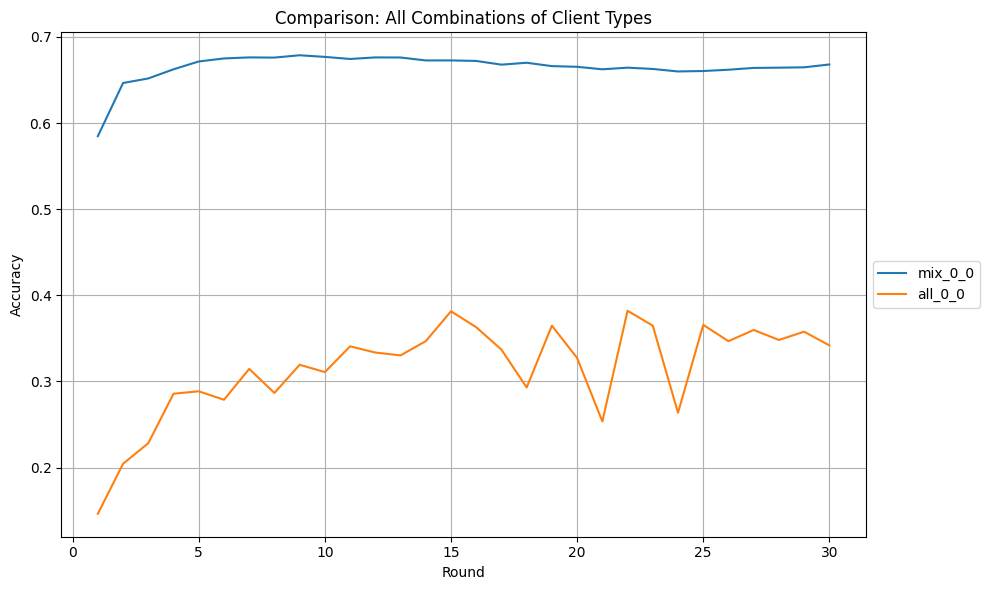

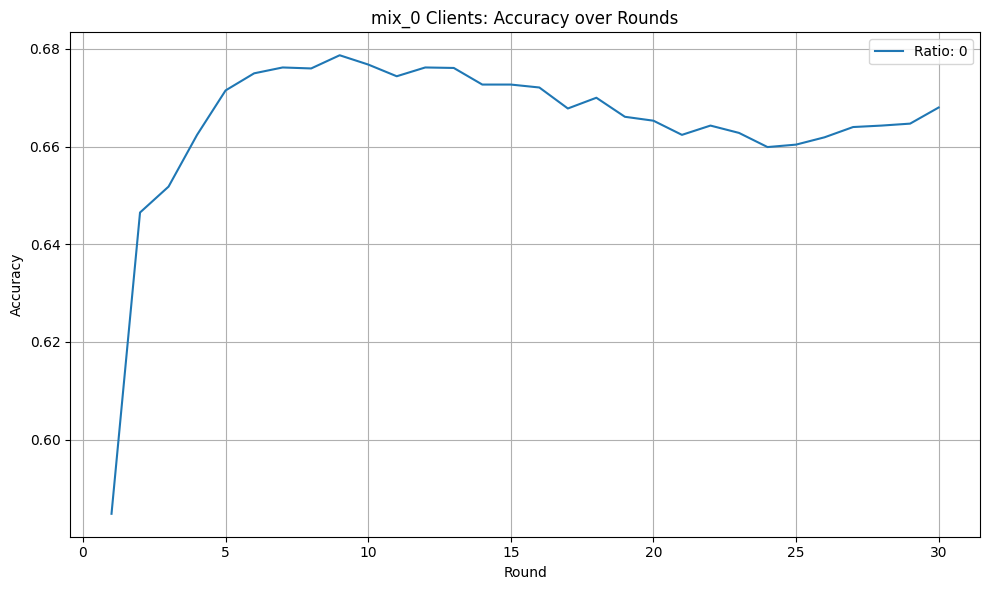

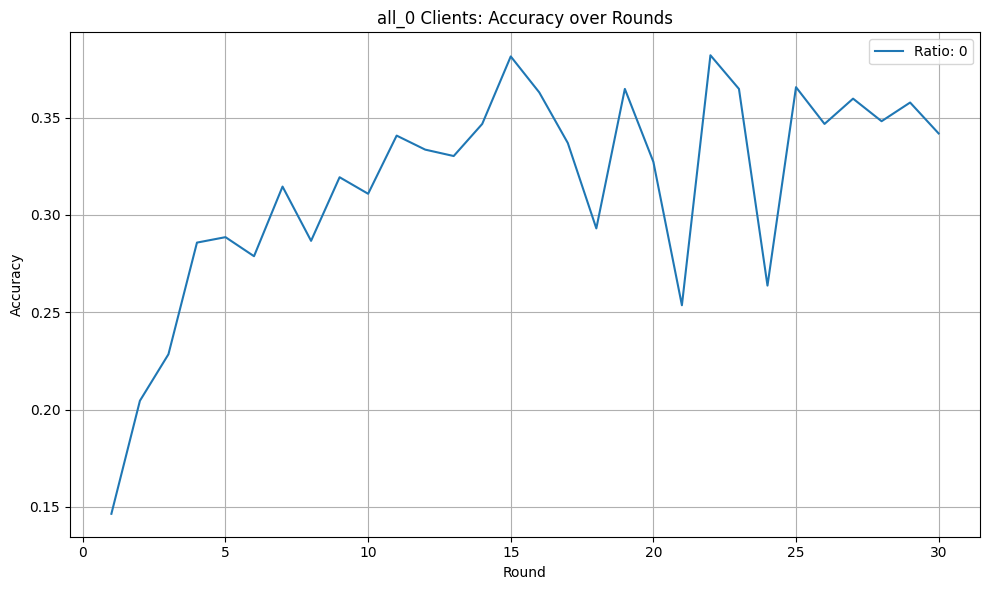

In [32]:
# ===== 결과 시각화 =====
plot_results()

In [33]:
import ray
ray.shutdown()
